In [130]:
import spotipy
from spotipy.oauth2 import SpotifyOAuth
import pandas as pd
import matplotlib.pyplot as plt
import plotly.express as px
from collections import Counter 
from wordcloud import WordCloud, STOPWORDS, ImageColorGenerator

In [145]:

sp = spotipy.Spotify(auth_manager=SpotifyOAuth(client_id="",
                                               client_secret="",
                                               redirect_uri="https://www.google.com/",
                                               scope="user-library-read, user-read-currently-playing, user-top-read"))    

In [51]:
results = sp.current_user_saved_tracks(limit = 20)
songs = list()


for idx, item in enumerate(results['items']):
    song = {}
    track = item['track']
    artistName = track['artists'][0]['name']
    trackName = track['name']
    print(idx, track['artists'][0]['name'], " – ", track['name'])
    song['artist'] = artistName
    song['songName'] = trackName
    songs.append(song)


0 Ramin Djawadi  –  Main Title - From The "Game Of Thrones" Soundtrack
1 Lalalar  –  İsyanlar
2 Rod Stewart  –  Young Turks - 2008 Remaster
3 Kanye West  –  Wolves
4 Kanye West  –  Real Friends
5 Kanye West  –  Waves
6 Jimi Hendrix  –  Hey Joe
7 Supertramp  –  Fool's Overture
8 Kavinsky  –  Nightcall
9 Kaan Boşnak  –  Bırakma Kendini
10 Kaan Boşnak  –  Şeyhim Beni Işınla
11 Rockwell  –  Somebody's Watching Me
12 Turnerjoy  –  Torturous
13 Jukka Nousiainen  –  Manuaalit Hukassa
14 Joy Division  –  New Dawn Fades - 2007 Remaster
15 Kaleidoscope  –  Once Upon a Time There Was a World
16 Camel  –  Air Born
17 Kafabindünya  –  Anger Circus
18 Jóhann Jóhannsson  –  London, 1988
19 Lavinia Meijer  –  Sur le fil


In [52]:
songs[0]

{'artist': 'Ramin Djawadi',
 'songName': 'Main Title - From The "Game Of Thrones" Soundtrack'}

In [53]:
import pandas as pd 
pd.DataFrame.from_dict(songs)

,artist,songName
0,Ramin Djawadi,"Main Title - From The ""Game Of Thrones"" Soundt..."
1,Lalalar,İsyanlar
2,Rod Stewart,Young Turks - 2008 Remaster
3,Kanye West,Wolves
4,Kanye West,Real Friends
5,Kanye West,Waves
6,Jimi Hendrix,Hey Joe
7,Supertramp,Fool's Overture
8,Kavinsky,Nightcall
9,Kaan Boşnak,Bırakma Kendini


## Understanding the data returned by results

**type of the results**

In [54]:
type(results)

dict

In [55]:
results

{'href': 'https://api.spotify.com/v1/me/tracks?offset=0&limit=20',
 'items': [{'added_at': '2022-05-22T20:01:06Z',
   'track': {'album': {'album_type': 'album',
     'artists': [{'external_urls': {'spotify': 'https://open.spotify.com/artist/1hCkSJcXREhrodeIHQdav8'},
       'href': 'https://api.spotify.com/v1/artists/1hCkSJcXREhrodeIHQdav8',
       'id': '1hCkSJcXREhrodeIHQdav8',
       'name': 'Ramin Djawadi',
       'type': 'artist',
       'uri': 'spotify:artist:1hCkSJcXREhrodeIHQdav8'}],
     'available_markets': ['AD',
      'AE',
      'AG',
      'AL',
      'AM',
      'AO',
      'AR',
      'AT',
      'AU',
      'AZ',
      'BA',
      'BB',
      'BD',
      'BE',
      'BF',
      'BG',
      'BH',
      'BI',
      'BJ',
      'BN',
      'BO',
      'BR',
      'BS',
      'BT',
      'BW',
      'BY',
      'BZ',
      'CA',
      'CD',
      'CG',
      'CH',
      'CI',
      'CL',
      'CM',
      'CO',
      'CR',
      'CV',
      'CW',
      'CY',
      'CZ',
   

**results keys**

In [56]:
results.keys()

dict_keys(['href', 'items', 'limit', 'next', 'offset', 'previous', 'total'])

In [57]:
results['next']

'https://api.spotify.com/v1/me/tracks?offset=20&limit=20'

In [58]:
type(results['items'])

list

In [61]:
results["items"][0].keys()

dict_keys(['added_at', 'track'])

In [62]:
results["items"]

[{'added_at': '2022-05-22T20:01:06Z',
  'track': {'album': {'album_type': 'album',
    'artists': [{'external_urls': {'spotify': 'https://open.spotify.com/artist/1hCkSJcXREhrodeIHQdav8'},
      'href': 'https://api.spotify.com/v1/artists/1hCkSJcXREhrodeIHQdav8',
      'id': '1hCkSJcXREhrodeIHQdav8',
      'name': 'Ramin Djawadi',
      'type': 'artist',
      'uri': 'spotify:artist:1hCkSJcXREhrodeIHQdav8'}],
    'available_markets': ['AD',
     'AE',
     'AG',
     'AL',
     'AM',
     'AO',
     'AR',
     'AT',
     'AU',
     'AZ',
     'BA',
     'BB',
     'BD',
     'BE',
     'BF',
     'BG',
     'BH',
     'BI',
     'BJ',
     'BN',
     'BO',
     'BR',
     'BS',
     'BT',
     'BW',
     'BY',
     'BZ',
     'CA',
     'CD',
     'CG',
     'CH',
     'CI',
     'CL',
     'CM',
     'CO',
     'CR',
     'CV',
     'CW',
     'CY',
     'CZ',
     'DE',
     'DJ',
     'DK',
     'DM',
     'DO',
     'DZ',
     'EC',
     'EE',
     'EG',
     'ES',
     'FI',
     '

# ALL LIKED SONGS ANALYSIS

## Get all liked songs 

In [63]:
limit_step=50
tracks = []

for offset in range(0, 10000000, limit_step):
    response = sp.current_user_saved_tracks(
        limit=limit_step,
        offset=offset,
    )
    print(response)
    if response['next'] is None:
        tracks.append(response['items'])
        break
    tracks.append(response['items'])
    


{'href': 'https://api.spotify.com/v1/me/tracks?offset=0&limit=50', 'items': [{'added_at': '2022-05-22T20:01:06Z', 'track': {'album': {'album_type': 'album', 'artists': [{'external_urls': {'spotify': 'https://open.spotify.com/artist/1hCkSJcXREhrodeIHQdav8'}, 'href': 'https://api.spotify.com/v1/artists/1hCkSJcXREhrodeIHQdav8', 'id': '1hCkSJcXREhrodeIHQdav8', 'name': 'Ramin Djawadi', 'type': 'artist', 'uri': 'spotify:artist:1hCkSJcXREhrodeIHQdav8'}], 'available_markets': ['AD', 'AE', 'AG', 'AL', 'AM', 'AO', 'AR', 'AT', 'AU', 'AZ', 'BA', 'BB', 'BD', 'BE', 'BF', 'BG', 'BH', 'BI', 'BJ', 'BN', 'BO', 'BR', 'BS', 'BT', 'BW', 'BY', 'BZ', 'CA', 'CD', 'CG', 'CH', 'CI', 'CL', 'CM', 'CO', 'CR', 'CV', 'CW', 'CY', 'CZ', 'DE', 'DJ', 'DK', 'DM', 'DO', 'DZ', 'EC', 'EE', 'EG', 'ES', 'FI', 'FJ', 'FM', 'FR', 'GA', 'GB', 'GD', 'GE', 'GH', 'GM', 'GN', 'GQ', 'GR', 'GT', 'GW', 'GY', 'HK', 'HN', 'HR', 'HT', 'HU', 'ID', 'IE', 'IL', 'IN', 'IQ', 'IS', 'IT', 'JM', 'JO', 'JP', 'KE', 'KG', 'KH', 'KI', 'KM', 'KN', 'KR'

{'href': 'https://api.spotify.com/v1/me/tracks?offset=50&limit=50', 'items': [{'added_at': '2022-03-26T21:07:11Z', 'track': {'album': {'album_type': 'album', 'artists': [{'external_urls': {'spotify': 'https://open.spotify.com/artist/36QJpDe2go2KgaRleHCDTp'}, 'href': 'https://api.spotify.com/v1/artists/36QJpDe2go2KgaRleHCDTp', 'id': '36QJpDe2go2KgaRleHCDTp', 'name': 'Led Zeppelin', 'type': 'artist', 'uri': 'spotify:artist:36QJpDe2go2KgaRleHCDTp'}], 'available_markets': ['AD', 'AE', 'AG', 'AL', 'AM', 'AO', 'AR', 'AT', 'AU', 'AZ', 'BA', 'BB', 'BD', 'BE', 'BF', 'BG', 'BH', 'BI', 'BJ', 'BN', 'BO', 'BR', 'BS', 'BW', 'BY', 'BZ', 'CA', 'CD', 'CG', 'CH', 'CI', 'CL', 'CM', 'CO', 'CR', 'CV', 'CW', 'CY', 'CZ', 'DE', 'DJ', 'DK', 'DM', 'DO', 'DZ', 'EC', 'EE', 'EG', 'ES', 'FI', 'FJ', 'FM', 'FR', 'GA', 'GB', 'GD', 'GH', 'GM', 'GN', 'GQ', 'GR', 'GT', 'GW', 'HK', 'HN', 'HR', 'HT', 'HU', 'ID', 'IE', 'IL', 'IN', 'IQ', 'IS', 'IT', 'JM', 'JO', 'JP', 'KE', 'KG', 'KH', 'KM', 'KN', 'KR', 'KW', 'KZ', 'LA', 'LB'

{'href': 'https://api.spotify.com/v1/me/tracks?offset=100&limit=50', 'items': [{'added_at': '2022-03-18T15:15:33Z', 'track': {'album': {'album_type': 'album', 'artists': [{'external_urls': {'spotify': 'https://open.spotify.com/artist/1Yox196W7bzVNZI7RBaPnf'}, 'href': 'https://api.spotify.com/v1/artists/1Yox196W7bzVNZI7RBaPnf', 'id': '1Yox196W7bzVNZI7RBaPnf', 'name': 'Megadeth', 'type': 'artist', 'uri': 'spotify:artist:1Yox196W7bzVNZI7RBaPnf'}], 'available_markets': ['AD', 'AE', 'AG', 'AL', 'AM', 'AO', 'AR', 'AT', 'AU', 'AZ', 'BA', 'BB', 'BD', 'BE', 'BF', 'BG', 'BH', 'BI', 'BJ', 'BN', 'BO', 'BR', 'BS', 'BT', 'BW', 'BY', 'BZ', 'CA', 'CD', 'CG', 'CH', 'CI', 'CL', 'CM', 'CO', 'CR', 'CV', 'CW', 'CY', 'CZ', 'DE', 'DJ', 'DK', 'DM', 'DO', 'DZ', 'EC', 'EE', 'EG', 'ES', 'FI', 'FJ', 'FM', 'FR', 'GA', 'GB', 'GD', 'GE', 'GH', 'GM', 'GN', 'GQ', 'GR', 'GT', 'GW', 'GY', 'HK', 'HN', 'HR', 'HT', 'HU', 'ID', 'IE', 'IL', 'IN', 'IQ', 'IS', 'IT', 'JM', 'JO', 'JP', 'KE', 'KG', 'KH', 'KI', 'KM', 'KN', 'KR', '

{'href': 'https://api.spotify.com/v1/me/tracks?offset=150&limit=50', 'items': [{'added_at': '2022-02-24T12:18:05Z', 'track': {'album': {'album_type': 'album', 'artists': [{'external_urls': {'spotify': 'https://open.spotify.com/artist/5NXHXK6hOCotCF8lvGM1I0'}, 'href': 'https://api.spotify.com/v1/artists/5NXHXK6hOCotCF8lvGM1I0', 'id': '5NXHXK6hOCotCF8lvGM1I0', 'name': 'Porcupine Tree', 'type': 'artist', 'uri': 'spotify:artist:5NXHXK6hOCotCF8lvGM1I0'}], 'available_markets': ['AD', 'AE', 'AG', 'AL', 'AM', 'AO', 'AR', 'AT', 'AU', 'AZ', 'BA', 'BB', 'BD', 'BE', 'BF', 'BG', 'BH', 'BI', 'BJ', 'BN', 'BO', 'BR', 'BS', 'BT', 'BW', 'BY', 'BZ', 'CA', 'CD', 'CG', 'CH', 'CI', 'CL', 'CM', 'CO', 'CR', 'CV', 'CW', 'CY', 'CZ', 'DE', 'DJ', 'DK', 'DM', 'DO', 'DZ', 'EC', 'EE', 'EG', 'ES', 'FI', 'FJ', 'FM', 'FR', 'GA', 'GB', 'GD', 'GE', 'GH', 'GM', 'GN', 'GQ', 'GR', 'GT', 'GW', 'GY', 'HK', 'HN', 'HR', 'HT', 'HU', 'ID', 'IE', 'IL', 'IN', 'IQ', 'IS', 'IT', 'JM', 'JO', 'JP', 'KE', 'KG', 'KH', 'KI', 'KM', 'KN', '

{'href': 'https://api.spotify.com/v1/me/tracks?offset=200&limit=50', 'items': [{'added_at': '2022-01-21T18:41:48Z', 'track': {'album': {'album_type': 'album', 'artists': [{'external_urls': {'spotify': 'https://open.spotify.com/artist/5ixQSDvAMa5O758xG8MWXT'}, 'href': 'https://api.spotify.com/v1/artists/5ixQSDvAMa5O758xG8MWXT', 'id': '5ixQSDvAMa5O758xG8MWXT', 'name': 'mor ve ötesi', 'type': 'artist', 'uri': 'spotify:artist:5ixQSDvAMa5O758xG8MWXT'}], 'available_markets': ['AD', 'AE', 'AG', 'AL', 'AM', 'AO', 'AR', 'AT', 'AU', 'AZ', 'BA', 'BB', 'BD', 'BE', 'BF', 'BG', 'BH', 'BI', 'BJ', 'BN', 'BO', 'BR', 'BS', 'BT', 'BW', 'BY', 'BZ', 'CA', 'CD', 'CG', 'CH', 'CI', 'CL', 'CM', 'CO', 'CR', 'CV', 'CW', 'CY', 'CZ', 'DE', 'DJ', 'DK', 'DM', 'DO', 'DZ', 'EC', 'EE', 'EG', 'ES', 'FI', 'FJ', 'FM', 'FR', 'GA', 'GB', 'GD', 'GE', 'GH', 'GM', 'GN', 'GQ', 'GR', 'GT', 'GW', 'GY', 'HK', 'HN', 'HR', 'HT', 'HU', 'ID', 'IE', 'IL', 'IN', 'IQ', 'IS', 'IT', 'JM', 'JO', 'JP', 'KE', 'KG', 'KH', 'KI', 'KM', 'KN', 'KR

{'href': 'https://api.spotify.com/v1/me/tracks?offset=250&limit=50', 'items': [{'added_at': '2021-12-14T17:49:46Z', 'track': {'album': {'album_type': 'album', 'artists': [{'external_urls': {'spotify': 'https://open.spotify.com/artist/72xb37kgUWGPVJqqBFhGKq'}, 'href': 'https://api.spotify.com/v1/artists/72xb37kgUWGPVJqqBFhGKq', 'id': '72xb37kgUWGPVJqqBFhGKq', 'name': 'Hey! Douglas', 'type': 'artist', 'uri': 'spotify:artist:72xb37kgUWGPVJqqBFhGKq'}], 'available_markets': ['AD', 'AE', 'AG', 'AL', 'AM', 'AO', 'AR', 'AT', 'AU', 'AZ', 'BA', 'BB', 'BD', 'BE', 'BF', 'BG', 'BH', 'BI', 'BJ', 'BN', 'BO', 'BR', 'BS', 'BT', 'BW', 'BY', 'BZ', 'CA', 'CD', 'CG', 'CH', 'CI', 'CL', 'CM', 'CO', 'CR', 'CV', 'CW', 'CY', 'CZ', 'DE', 'DJ', 'DK', 'DM', 'DO', 'DZ', 'EC', 'EE', 'EG', 'ES', 'FI', 'FJ', 'FM', 'FR', 'GA', 'GB', 'GD', 'GE', 'GH', 'GM', 'GN', 'GQ', 'GR', 'GT', 'GW', 'GY', 'HK', 'HN', 'HR', 'HT', 'HU', 'ID', 'IE', 'IL', 'IN', 'IQ', 'IS', 'IT', 'JM', 'JO', 'JP', 'KE', 'KG', 'KH', 'KI', 'KM', 'KN', 'KR

{'href': 'https://api.spotify.com/v1/me/tracks?offset=300&limit=50', 'items': [{'added_at': '2021-11-02T13:31:43Z', 'track': {'album': {'album_type': 'single', 'artists': [{'external_urls': {'spotify': 'https://open.spotify.com/artist/4dDb2XLONSNrTrucRcoaYM'}, 'href': 'https://api.spotify.com/v1/artists/4dDb2XLONSNrTrucRcoaYM', 'id': '4dDb2XLONSNrTrucRcoaYM', 'name': 'Really Slow Motion', 'type': 'artist', 'uri': 'spotify:artist:4dDb2XLONSNrTrucRcoaYM'}], 'available_markets': ['AD', 'AE', 'AG', 'AL', 'AM', 'AO', 'AR', 'AT', 'AU', 'AZ', 'BA', 'BB', 'BD', 'BE', 'BF', 'BG', 'BH', 'BI', 'BJ', 'BN', 'BO', 'BR', 'BS', 'BT', 'BW', 'BY', 'BZ', 'CA', 'CD', 'CG', 'CH', 'CI', 'CL', 'CM', 'CO', 'CR', 'CV', 'CW', 'CY', 'CZ', 'DE', 'DJ', 'DK', 'DM', 'DO', 'DZ', 'EC', 'EE', 'EG', 'ES', 'FI', 'FJ', 'FM', 'FR', 'GA', 'GB', 'GD', 'GE', 'GH', 'GM', 'GN', 'GQ', 'GR', 'GT', 'GW', 'GY', 'HK', 'HN', 'HR', 'HT', 'HU', 'ID', 'IE', 'IL', 'IN', 'IQ', 'IS', 'IT', 'JM', 'JO', 'JP', 'KE', 'KG', 'KH', 'KI', 'KM', 'K

{'href': 'https://api.spotify.com/v1/me/tracks?offset=350&limit=50', 'items': [{'added_at': '2021-10-09T19:27:18Z', 'track': {'album': {'album_type': 'album', 'artists': [{'external_urls': {'spotify': 'https://open.spotify.com/artist/4HLWX9kzfraiCsTvrxJEXm'}, 'href': 'https://api.spotify.com/v1/artists/4HLWX9kzfraiCsTvrxJEXm', 'id': '4HLWX9kzfraiCsTvrxJEXm', 'name': 'The Chameleons', 'type': 'artist', 'uri': 'spotify:artist:4HLWX9kzfraiCsTvrxJEXm'}], 'available_markets': ['AD', 'AE', 'AG', 'AL', 'AM', 'AO', 'AR', 'AT', 'AU', 'AZ', 'BA', 'BB', 'BD', 'BE', 'BF', 'BG', 'BH', 'BI', 'BJ', 'BN', 'BO', 'BR', 'BS', 'BT', 'BW', 'BY', 'BZ', 'CA', 'CD', 'CG', 'CH', 'CI', 'CL', 'CM', 'CO', 'CR', 'CV', 'CW', 'CY', 'CZ', 'DE', 'DJ', 'DK', 'DM', 'DO', 'DZ', 'EC', 'EE', 'EG', 'ES', 'FI', 'FJ', 'FM', 'FR', 'GA', 'GB', 'GD', 'GE', 'GH', 'GM', 'GN', 'GQ', 'GR', 'GT', 'GW', 'GY', 'HK', 'HN', 'HR', 'HT', 'HU', 'ID', 'IE', 'IL', 'IN', 'IQ', 'IS', 'IT', 'JM', 'JO', 'JP', 'KE', 'KG', 'KH', 'KI', 'KM', 'KN', '

{'href': 'https://api.spotify.com/v1/me/tracks?offset=400&limit=50', 'items': [{'added_at': '2021-09-04T17:30:24Z', 'track': {'album': {'album_type': 'album', 'artists': [{'external_urls': {'spotify': 'https://open.spotify.com/artist/20kRNjGAzhnBIflemL8JfY'}, 'href': 'https://api.spotify.com/v1/artists/20kRNjGAzhnBIflemL8JfY', 'id': '20kRNjGAzhnBIflemL8JfY', 'name': 'Romeo Void', 'type': 'artist', 'uri': 'spotify:artist:20kRNjGAzhnBIflemL8JfY'}], 'available_markets': ['AD', 'AE', 'AG', 'AL', 'AM', 'AO', 'AR', 'AT', 'AU', 'AZ', 'BA', 'BB', 'BD', 'BE', 'BF', 'BG', 'BH', 'BI', 'BJ', 'BN', 'BO', 'BR', 'BS', 'BT', 'BW', 'BY', 'BZ', 'CA', 'CD', 'CG', 'CH', 'CI', 'CL', 'CM', 'CO', 'CR', 'CV', 'CW', 'CY', 'CZ', 'DE', 'DJ', 'DK', 'DM', 'DO', 'DZ', 'EC', 'EE', 'EG', 'ES', 'FI', 'FJ', 'FM', 'FR', 'GA', 'GB', 'GD', 'GE', 'GH', 'GM', 'GN', 'GQ', 'GR', 'GT', 'GW', 'GY', 'HK', 'HN', 'HR', 'HT', 'HU', 'ID', 'IE', 'IL', 'IN', 'IQ', 'IS', 'IT', 'JM', 'JO', 'JP', 'KE', 'KG', 'KH', 'KI', 'KM', 'KN', 'KR',

{'href': 'https://api.spotify.com/v1/me/tracks?offset=450&limit=50', 'items': [{'added_at': '2021-08-30T14:30:11Z', 'track': {'album': {'album_type': 'album', 'artists': [{'external_urls': {'spotify': 'https://open.spotify.com/artist/44wLgA9gxORLwDGRvYpRBg'}, 'href': 'https://api.spotify.com/v1/artists/44wLgA9gxORLwDGRvYpRBg', 'id': '44wLgA9gxORLwDGRvYpRBg', 'name': 'Farazi', 'type': 'artist', 'uri': 'spotify:artist:44wLgA9gxORLwDGRvYpRBg'}], 'available_markets': ['AD', 'AE', 'AG', 'AL', 'AM', 'AO', 'AR', 'AT', 'AU', 'AZ', 'BA', 'BB', 'BD', 'BE', 'BF', 'BG', 'BH', 'BI', 'BJ', 'BN', 'BO', 'BR', 'BS', 'BT', 'BW', 'BY', 'BZ', 'CA', 'CD', 'CG', 'CH', 'CI', 'CL', 'CM', 'CO', 'CR', 'CV', 'CW', 'CY', 'CZ', 'DE', 'DJ', 'DK', 'DM', 'DO', 'DZ', 'EC', 'EE', 'EG', 'ES', 'FI', 'FJ', 'FM', 'FR', 'GA', 'GB', 'GD', 'GE', 'GH', 'GM', 'GN', 'GQ', 'GR', 'GT', 'GW', 'GY', 'HK', 'HN', 'HR', 'HT', 'HU', 'ID', 'IE', 'IL', 'IN', 'IQ', 'IS', 'IT', 'JM', 'JO', 'JP', 'KE', 'KG', 'KH', 'KI', 'KM', 'KN', 'KR', 'KW

{'href': 'https://api.spotify.com/v1/me/tracks?offset=500&limit=50', 'items': [{'added_at': '2021-07-22T12:50:21Z', 'track': {'album': {'album_type': 'album', 'artists': [{'external_urls': {'spotify': 'https://open.spotify.com/artist/0fA0VVWsXO9YnASrzqfmYu'}, 'href': 'https://api.spotify.com/v1/artists/0fA0VVWsXO9YnASrzqfmYu', 'id': '0fA0VVWsXO9YnASrzqfmYu', 'name': 'Kid Cudi', 'type': 'artist', 'uri': 'spotify:artist:0fA0VVWsXO9YnASrzqfmYu'}], 'available_markets': ['AD', 'AE', 'AG', 'AL', 'AM', 'AO', 'AR', 'AT', 'AU', 'AZ', 'BA', 'BB', 'BD', 'BE', 'BF', 'BG', 'BH', 'BI', 'BJ', 'BN', 'BO', 'BR', 'BS', 'BT', 'BW', 'BY', 'BZ', 'CA', 'CD', 'CG', 'CH', 'CI', 'CL', 'CM', 'CO', 'CR', 'CV', 'CW', 'CY', 'CZ', 'DE', 'DJ', 'DK', 'DM', 'DO', 'DZ', 'EC', 'EE', 'EG', 'ES', 'FI', 'FJ', 'FM', 'FR', 'GA', 'GB', 'GD', 'GE', 'GH', 'GM', 'GN', 'GQ', 'GR', 'GT', 'GW', 'GY', 'HK', 'HN', 'HR', 'HT', 'HU', 'ID', 'IE', 'IL', 'IN', 'IQ', 'IS', 'IT', 'JM', 'JO', 'JP', 'KE', 'KG', 'KH', 'KI', 'KM', 'KN', 'KR', '

{'href': 'https://api.spotify.com/v1/me/tracks?offset=550&limit=50', 'items': [{'added_at': '2021-06-28T21:42:25Z', 'track': {'album': {'album_type': 'album', 'artists': [{'external_urls': {'spotify': 'https://open.spotify.com/artist/7jefIIksOi1EazgRTfW2Pk'}, 'href': 'https://api.spotify.com/v1/artists/7jefIIksOi1EazgRTfW2Pk', 'id': '7jefIIksOi1EazgRTfW2Pk', 'name': 'Electric Light Orchestra', 'type': 'artist', 'uri': 'spotify:artist:7jefIIksOi1EazgRTfW2Pk'}], 'available_markets': ['AD', 'AE', 'AG', 'AL', 'AM', 'AO', 'AR', 'AT', 'AU', 'AZ', 'BA', 'BB', 'BD', 'BE', 'BF', 'BG', 'BH', 'BI', 'BJ', 'BN', 'BO', 'BR', 'BS', 'BT', 'BW', 'BY', 'BZ', 'CA', 'CD', 'CG', 'CH', 'CI', 'CL', 'CM', 'CO', 'CR', 'CV', 'CW', 'CY', 'CZ', 'DE', 'DJ', 'DK', 'DM', 'DO', 'DZ', 'EC', 'EE', 'EG', 'ES', 'FI', 'FJ', 'FM', 'FR', 'GA', 'GB', 'GD', 'GE', 'GH', 'GM', 'GN', 'GQ', 'GR', 'GT', 'GW', 'GY', 'HK', 'HN', 'HR', 'HT', 'HU', 'ID', 'IE', 'IL', 'IN', 'IQ', 'IS', 'IT', 'JM', 'JO', 'JP', 'KE', 'KG', 'KH', 'KI', 'KM

{'href': 'https://api.spotify.com/v1/me/tracks?offset=600&limit=50', 'items': [{'added_at': '2021-06-22T23:41:42Z', 'track': {'album': {'album_type': 'album', 'artists': [{'external_urls': {'spotify': 'https://open.spotify.com/artist/77zwstbi3x1IxnbDFg6uns'}, 'href': 'https://api.spotify.com/v1/artists/77zwstbi3x1IxnbDFg6uns', 'id': '77zwstbi3x1IxnbDFg6uns', 'name': 'Wishbone Ash', 'type': 'artist', 'uri': 'spotify:artist:77zwstbi3x1IxnbDFg6uns'}], 'available_markets': [], 'external_urls': {'spotify': 'https://open.spotify.com/album/5v2VhaPqn4kydTX06Mdvse'}, 'href': 'https://api.spotify.com/v1/albums/5v2VhaPqn4kydTX06Mdvse', 'id': '5v2VhaPqn4kydTX06Mdvse', 'images': [{'height': 640, 'url': 'https://i.scdn.co/image/ab67616d0000b27337ee1993f80859071145171b', 'width': 640}, {'height': 300, 'url': 'https://i.scdn.co/image/ab67616d00001e0237ee1993f80859071145171b', 'width': 300}, {'height': 64, 'url': 'https://i.scdn.co/image/ab67616d0000485137ee1993f80859071145171b', 'width': 64}], 'name':

{'href': 'https://api.spotify.com/v1/me/tracks?offset=650&limit=50', 'items': [{'added_at': '2021-06-10T14:15:33Z', 'track': {'album': {'album_type': 'album', 'artists': [{'external_urls': {'spotify': 'https://open.spotify.com/artist/5BcZ22XONcRoLhTbZRuME1'}, 'href': 'https://api.spotify.com/v1/artists/5BcZ22XONcRoLhTbZRuME1', 'id': '5BcZ22XONcRoLhTbZRuME1', 'name': 'The Moody Blues', 'type': 'artist', 'uri': 'spotify:artist:5BcZ22XONcRoLhTbZRuME1'}], 'available_markets': ['AD', 'AE', 'AG', 'AL', 'AM', 'AO', 'AR', 'AT', 'AU', 'AZ', 'BA', 'BB', 'BD', 'BE', 'BF', 'BG', 'BH', 'BI', 'BJ', 'BN', 'BO', 'BR', 'BS', 'BT', 'BW', 'BY', 'BZ', 'CA', 'CD', 'CG', 'CH', 'CI', 'CL', 'CM', 'CO', 'CR', 'CV', 'CW', 'CY', 'CZ', 'DE', 'DJ', 'DK', 'DM', 'DO', 'DZ', 'EC', 'EE', 'EG', 'ES', 'FI', 'FJ', 'FM', 'FR', 'GA', 'GB', 'GD', 'GE', 'GH', 'GM', 'GN', 'GQ', 'GR', 'GT', 'GW', 'GY', 'HK', 'HN', 'HR', 'HT', 'HU', 'ID', 'IE', 'IL', 'IN', 'IQ', 'IS', 'IT', 'JM', 'JO', 'JP', 'KE', 'KG', 'KH', 'KI', 'KM', 'KN', 

{'href': 'https://api.spotify.com/v1/me/tracks?offset=700&limit=50', 'items': [{'added_at': '2021-06-06T12:56:16Z', 'track': {'album': {'album_type': 'album', 'artists': [{'external_urls': {'spotify': 'https://open.spotify.com/artist/3ycxRkcZ67ALN3GQJ57Vig'}, 'href': 'https://api.spotify.com/v1/artists/3ycxRkcZ67ALN3GQJ57Vig', 'id': '3ycxRkcZ67ALN3GQJ57Vig', 'name': 'Masego', 'type': 'artist', 'uri': 'spotify:artist:3ycxRkcZ67ALN3GQJ57Vig'}], 'available_markets': ['AD', 'AE', 'AG', 'AL', 'AM', 'AO', 'AR', 'AT', 'AU', 'AZ', 'BA', 'BB', 'BD', 'BE', 'BF', 'BG', 'BH', 'BI', 'BJ', 'BN', 'BO', 'BR', 'BS', 'BT', 'BW', 'BY', 'BZ', 'CA', 'CD', 'CG', 'CH', 'CI', 'CL', 'CM', 'CO', 'CR', 'CV', 'CW', 'CY', 'CZ', 'DE', 'DJ', 'DK', 'DM', 'DO', 'DZ', 'EC', 'EE', 'EG', 'ES', 'FI', 'FJ', 'FM', 'FR', 'GA', 'GB', 'GD', 'GE', 'GH', 'GM', 'GN', 'GQ', 'GR', 'GT', 'GW', 'GY', 'HK', 'HN', 'HR', 'HT', 'HU', 'ID', 'IE', 'IL', 'IN', 'IQ', 'IS', 'IT', 'JM', 'JO', 'JP', 'KE', 'KG', 'KH', 'KI', 'KM', 'KN', 'KR', 'KW

{'href': 'https://api.spotify.com/v1/me/tracks?offset=750&limit=50', 'items': [{'added_at': '2021-06-04T20:11:02Z', 'track': {'album': {'album_type': 'album', 'artists': [{'external_urls': {'spotify': 'https://open.spotify.com/artist/4tZwfgrHOc3mvqYlEYSvVi'}, 'href': 'https://api.spotify.com/v1/artists/4tZwfgrHOc3mvqYlEYSvVi', 'id': '4tZwfgrHOc3mvqYlEYSvVi', 'name': 'Daft Punk', 'type': 'artist', 'uri': 'spotify:artist:4tZwfgrHOc3mvqYlEYSvVi'}], 'available_markets': ['AD', 'AE', 'AG', 'AL', 'AM', 'AO', 'AR', 'AT', 'AU', 'AZ', 'BA', 'BB', 'BD', 'BE', 'BF', 'BG', 'BH', 'BI', 'BJ', 'BN', 'BO', 'BR', 'BS', 'BT', 'BW', 'BY', 'BZ', 'CA', 'CD', 'CG', 'CH', 'CI', 'CL', 'CM', 'CO', 'CR', 'CV', 'CW', 'CY', 'CZ', 'DE', 'DJ', 'DK', 'DM', 'DO', 'DZ', 'EC', 'EE', 'EG', 'ES', 'FI', 'FJ', 'FM', 'FR', 'GA', 'GD', 'GE', 'GH', 'GM', 'GN', 'GQ', 'GR', 'GT', 'GW', 'GY', 'HK', 'HN', 'HR', 'HT', 'HU', 'ID', 'IE', 'IL', 'IN', 'IQ', 'IS', 'IT', 'JM', 'JO', 'JP', 'KE', 'KG', 'KH', 'KI', 'KM', 'KN', 'KR', 'KW', 

{'href': 'https://api.spotify.com/v1/me/tracks?offset=800&limit=50', 'items': [{'added_at': '2021-05-30T15:51:55Z', 'track': {'album': {'album_type': 'album', 'artists': [{'external_urls': {'spotify': 'https://open.spotify.com/artist/36QJpDe2go2KgaRleHCDTp'}, 'href': 'https://api.spotify.com/v1/artists/36QJpDe2go2KgaRleHCDTp', 'id': '36QJpDe2go2KgaRleHCDTp', 'name': 'Led Zeppelin', 'type': 'artist', 'uri': 'spotify:artist:36QJpDe2go2KgaRleHCDTp'}], 'available_markets': ['AG', 'AL', 'AM', 'AR', 'AT', 'AU', 'AZ', 'BA', 'BB', 'BE', 'BF', 'BG', 'BN', 'BO', 'BR', 'BS', 'BW', 'BY', 'BZ', 'CA', 'CH', 'CL', 'CO', 'CR', 'CV', 'CW', 'CY', 'CZ', 'DE', 'DK', 'DM', 'DO', 'EC', 'EE', 'ES', 'FI', 'FJ', 'FM', 'FR', 'GB', 'GD', 'GH', 'GM', 'GR', 'GT', 'GW', 'HK', 'HN', 'HR', 'HT', 'HU', 'ID', 'IE', 'IL', 'IN', 'IT', 'JM', 'JP', 'KE', 'KG', 'KH', 'KN', 'KR', 'KZ', 'LA', 'LC', 'LI', 'LK', 'LT', 'LU', 'LV', 'MD', 'ME', 'MK', 'MN', 'MO', 'MT', 'MU', 'MX', 'MY', 'MZ', 'NA', 'NE', 'NG', 'NI', 'NL', 'NO', 'NP

{'href': 'https://api.spotify.com/v1/me/tracks?offset=850&limit=50', 'items': [{'added_at': '2021-05-27T18:44:51Z', 'track': {'album': {'album_type': 'album', 'artists': [{'external_urls': {'spotify': 'https://open.spotify.com/artist/2FcC4sDMXme2ziI7tGKMK8'}, 'href': 'https://api.spotify.com/v1/artists/2FcC4sDMXme2ziI7tGKMK8', 'id': '2FcC4sDMXme2ziI7tGKMK8', 'name': 'David Gilmour', 'type': 'artist', 'uri': 'spotify:artist:2FcC4sDMXme2ziI7tGKMK8'}], 'available_markets': ['AD', 'AE', 'AG', 'AL', 'AM', 'AO', 'AR', 'AT', 'AU', 'AZ', 'BA', 'BB', 'BD', 'BE', 'BF', 'BG', 'BH', 'BI', 'BJ', 'BN', 'BO', 'BR', 'BS', 'BT', 'BW', 'BZ', 'CA', 'CD', 'CG', 'CH', 'CI', 'CL', 'CM', 'CO', 'CR', 'CV', 'CW', 'CY', 'CZ', 'DE', 'DJ', 'DK', 'DM', 'DO', 'DZ', 'EC', 'EE', 'EG', 'ES', 'FI', 'FJ', 'FM', 'FR', 'GA', 'GB', 'GD', 'GE', 'GH', 'GM', 'GN', 'GQ', 'GR', 'GT', 'GW', 'GY', 'HK', 'HN', 'HR', 'HT', 'HU', 'ID', 'IE', 'IL', 'IN', 'IQ', 'IS', 'IT', 'JM', 'JO', 'JP', 'KE', 'KG', 'KH', 'KI', 'KM', 'KN', 'KR', 'K

{'href': 'https://api.spotify.com/v1/me/tracks?offset=900&limit=50', 'items': [{'added_at': '2021-05-16T00:15:40Z', 'track': {'album': {'album_type': 'album', 'artists': [{'external_urls': {'spotify': 'https://open.spotify.com/artist/54R6Y0I7jGUCveDTtI21nb'}, 'href': 'https://api.spotify.com/v1/artists/54R6Y0I7jGUCveDTtI21nb', 'id': '54R6Y0I7jGUCveDTtI21nb', 'name': 'Boney M.', 'type': 'artist', 'uri': 'spotify:artist:54R6Y0I7jGUCveDTtI21nb'}], 'available_markets': ['AD', 'AE', 'AG', 'AL', 'AM', 'AO', 'AR', 'AT', 'AU', 'AZ', 'BA', 'BB', 'BD', 'BE', 'BF', 'BG', 'BH', 'BI', 'BJ', 'BN', 'BO', 'BR', 'BS', 'BT', 'BW', 'BY', 'BZ', 'CD', 'CG', 'CH', 'CI', 'CL', 'CM', 'CO', 'CR', 'CV', 'CW', 'CY', 'CZ', 'DE', 'DJ', 'DK', 'DM', 'DO', 'DZ', 'EC', 'EE', 'EG', 'ES', 'FI', 'FJ', 'FM', 'FR', 'GA', 'GB', 'GD', 'GE', 'GH', 'GM', 'GN', 'GQ', 'GR', 'GT', 'GW', 'GY', 'HK', 'HN', 'HR', 'HT', 'HU', 'ID', 'IE', 'IL', 'IN', 'IQ', 'IS', 'IT', 'JM', 'JO', 'JP', 'KE', 'KG', 'KH', 'KI', 'KM', 'KN', 'KR', 'KW', '

{'href': 'https://api.spotify.com/v1/me/tracks?offset=950&limit=50', 'items': [{'added_at': '2021-04-05T18:21:36Z', 'track': {'album': {'album_type': 'album', 'artists': [{'external_urls': {'spotify': 'https://open.spotify.com/artist/1iJrQKRh5aJnp6cG5lpITr'}, 'href': 'https://api.spotify.com/v1/artists/1iJrQKRh5aJnp6cG5lpITr', 'id': '1iJrQKRh5aJnp6cG5lpITr', 'name': 'Khontkar', 'type': 'artist', 'uri': 'spotify:artist:1iJrQKRh5aJnp6cG5lpITr'}], 'available_markets': ['AD', 'AE', 'AG', 'AL', 'AM', 'AO', 'AR', 'AT', 'AU', 'AZ', 'BA', 'BB', 'BD', 'BE', 'BF', 'BG', 'BH', 'BI', 'BJ', 'BN', 'BO', 'BR', 'BS', 'BT', 'BW', 'BY', 'BZ', 'CA', 'CD', 'CG', 'CH', 'CI', 'CL', 'CM', 'CO', 'CR', 'CV', 'CW', 'CY', 'CZ', 'DE', 'DJ', 'DK', 'DM', 'DO', 'DZ', 'EC', 'EE', 'EG', 'ES', 'FI', 'FJ', 'FM', 'FR', 'GA', 'GB', 'GD', 'GE', 'GH', 'GM', 'GN', 'GQ', 'GR', 'GT', 'GW', 'GY', 'HK', 'HN', 'HR', 'HT', 'HU', 'ID', 'IE', 'IL', 'IN', 'IQ', 'IS', 'IT', 'JM', 'JO', 'JP', 'KE', 'KG', 'KH', 'KI', 'KM', 'KN', 'KR', '

{'href': 'https://api.spotify.com/v1/me/tracks?offset=1000&limit=50', 'items': [{'added_at': '2021-03-13T12:00:06Z', 'track': {'album': {'album_type': 'single', 'artists': [{'external_urls': {'spotify': 'https://open.spotify.com/artist/4ogwGU9VPWrnVBs1GEwZVV'}, 'href': 'https://api.spotify.com/v1/artists/4ogwGU9VPWrnVBs1GEwZVV', 'id': '4ogwGU9VPWrnVBs1GEwZVV', 'name': 'Temples', 'type': 'artist', 'uri': 'spotify:artist:4ogwGU9VPWrnVBs1GEwZVV'}], 'available_markets': ['AD', 'AL', 'AM', 'AT', 'AU', 'AZ', 'BA', 'BE', 'BG', 'BY', 'CH', 'CW', 'CY', 'CZ', 'DE', 'DK', 'EE', 'ES', 'FI', 'FR', 'GB', 'GE', 'GR', 'HR', 'HU', 'IE', 'IS', 'IT', 'JP', 'LI', 'LT', 'LU', 'LV', 'MC', 'MD', 'ME', 'MK', 'MT', 'NL', 'NO', 'NZ', 'PL', 'PT', 'RO', 'RS', 'SE', 'SI', 'SK', 'SM', 'TR', 'UA', 'XK'], 'external_urls': {'spotify': 'https://open.spotify.com/album/5jF63Nw1BA7AEfug0V32qx'}, 'href': 'https://api.spotify.com/v1/albums/5jF63Nw1BA7AEfug0V32qx', 'id': '5jF63Nw1BA7AEfug0V32qx', 'images': [{'height': 640, '

{'href': 'https://api.spotify.com/v1/me/tracks?offset=1050&limit=50', 'items': [{'added_at': '2021-02-27T18:41:59Z', 'track': {'album': {'album_type': 'single', 'artists': [{'external_urls': {'spotify': 'https://open.spotify.com/artist/7ssDDQAUFA9Z5k5VbbqYxg'}, 'href': 'https://api.spotify.com/v1/artists/7ssDDQAUFA9Z5k5VbbqYxg', 'id': '7ssDDQAUFA9Z5k5VbbqYxg', 'name': 'Ağaçkakan', 'type': 'artist', 'uri': 'spotify:artist:7ssDDQAUFA9Z5k5VbbqYxg'}], 'available_markets': [], 'external_urls': {'spotify': 'https://open.spotify.com/album/52onETXkNYXPzpnX4kErY7'}, 'href': 'https://api.spotify.com/v1/albums/52onETXkNYXPzpnX4kErY7', 'id': '52onETXkNYXPzpnX4kErY7', 'images': [{'height': 640, 'url': 'https://i.scdn.co/image/ab67616d0000b273206f0059ac0c4907ab06695f', 'width': 640}, {'height': 300, 'url': 'https://i.scdn.co/image/ab67616d00001e02206f0059ac0c4907ab06695f', 'width': 300}, {'height': 64, 'url': 'https://i.scdn.co/image/ab67616d00004851206f0059ac0c4907ab06695f', 'width': 64}], 'name': 

{'href': 'https://api.spotify.com/v1/me/tracks?offset=1100&limit=50', 'items': [{'added_at': '2021-02-23T23:48:15Z', 'track': {'album': {'album_type': 'album', 'artists': [{'external_urls': {'spotify': 'https://open.spotify.com/artist/5ayy4bftuQvE2xTCbCEufB'}, 'href': 'https://api.spotify.com/v1/artists/5ayy4bftuQvE2xTCbCEufB', 'id': '5ayy4bftuQvE2xTCbCEufB', 'name': 'Farazi V Kayra', 'type': 'artist', 'uri': 'spotify:artist:5ayy4bftuQvE2xTCbCEufB'}, {'external_urls': {'spotify': 'https://open.spotify.com/artist/44wLgA9gxORLwDGRvYpRBg'}, 'href': 'https://api.spotify.com/v1/artists/44wLgA9gxORLwDGRvYpRBg', 'id': '44wLgA9gxORLwDGRvYpRBg', 'name': 'Farazi', 'type': 'artist', 'uri': 'spotify:artist:44wLgA9gxORLwDGRvYpRBg'}, {'external_urls': {'spotify': 'https://open.spotify.com/artist/5UqZ7BXoccyvTHyXLk1Pk3'}, 'href': 'https://api.spotify.com/v1/artists/5UqZ7BXoccyvTHyXLk1Pk3', 'id': '5UqZ7BXoccyvTHyXLk1Pk3', 'name': 'Kayra', 'type': 'artist', 'uri': 'spotify:artist:5UqZ7BXoccyvTHyXLk1Pk3

{'href': 'https://api.spotify.com/v1/me/tracks?offset=1150&limit=50', 'items': [{'added_at': '2021-02-21T15:59:25Z', 'track': {'album': {'album_type': 'album', 'artists': [{'external_urls': {'spotify': 'https://open.spotify.com/artist/5UzFfn3lNMWSm4PHCzBDi8'}, 'href': 'https://api.spotify.com/v1/artists/5UzFfn3lNMWSm4PHCzBDi8', 'id': '5UzFfn3lNMWSm4PHCzBDi8', 'name': 'Colour Haze', 'type': 'artist', 'uri': 'spotify:artist:5UzFfn3lNMWSm4PHCzBDi8'}], 'available_markets': ['AD', 'AE', 'AG', 'AL', 'AM', 'AO', 'AR', 'AT', 'AU', 'AZ', 'BA', 'BB', 'BD', 'BE', 'BF', 'BG', 'BH', 'BI', 'BJ', 'BN', 'BO', 'BR', 'BS', 'BT', 'BW', 'BY', 'BZ', 'CA', 'CD', 'CG', 'CH', 'CI', 'CL', 'CM', 'CO', 'CR', 'CV', 'CW', 'CY', 'CZ', 'DE', 'DJ', 'DK', 'DM', 'DO', 'DZ', 'EC', 'EE', 'EG', 'ES', 'FI', 'FJ', 'FM', 'FR', 'GA', 'GB', 'GD', 'GE', 'GH', 'GM', 'GN', 'GQ', 'GR', 'GT', 'GW', 'GY', 'HK', 'HN', 'HR', 'HT', 'HU', 'ID', 'IE', 'IL', 'IN', 'IQ', 'IS', 'IT', 'JM', 'JO', 'KE', 'KG', 'KH', 'KI', 'KM', 'KN', 'KR', 'KW

{'href': 'https://api.spotify.com/v1/me/tracks?offset=1200&limit=50', 'items': [{'added_at': '2021-02-16T13:31:30Z', 'track': {'album': {'album_type': 'album', 'artists': [{'external_urls': {'spotify': 'https://open.spotify.com/artist/2Hkut4rAAyrQxRdof7FVJq'}, 'href': 'https://api.spotify.com/v1/artists/2Hkut4rAAyrQxRdof7FVJq', 'id': '2Hkut4rAAyrQxRdof7FVJq', 'name': 'Rush', 'type': 'artist', 'uri': 'spotify:artist:2Hkut4rAAyrQxRdof7FVJq'}], 'available_markets': ['AD', 'AE', 'AG', 'AL', 'AM', 'AO', 'AR', 'AT', 'AU', 'AZ', 'BA', 'BB', 'BD', 'BE', 'BF', 'BG', 'BH', 'BI', 'BJ', 'BN', 'BO', 'BR', 'BS', 'BT', 'BW', 'BY', 'BZ', 'CD', 'CG', 'CH', 'CI', 'CL', 'CM', 'CO', 'CR', 'CV', 'CW', 'CY', 'CZ', 'DE', 'DJ', 'DK', 'DM', 'DO', 'DZ', 'EC', 'EE', 'EG', 'ES', 'FI', 'FJ', 'FM', 'FR', 'GA', 'GB', 'GD', 'GH', 'GM', 'GN', 'GQ', 'GR', 'GT', 'GW', 'GY', 'HK', 'HN', 'HR', 'HT', 'HU', 'ID', 'IE', 'IL', 'IN', 'IQ', 'IS', 'IT', 'JM', 'JO', 'KE', 'KG', 'KH', 'KI', 'KM', 'KN', 'KR', 'KW', 'KZ', 'LA', 'LB'

{'href': 'https://api.spotify.com/v1/me/tracks?offset=1250&limit=50', 'items': [{'added_at': '2021-02-11T23:01:37Z', 'track': {'album': {'album_type': 'album', 'artists': [{'external_urls': {'spotify': 'https://open.spotify.com/artist/4mw86zm4QZIL8SksdyE6OU'}, 'href': 'https://api.spotify.com/v1/artists/4mw86zm4QZIL8SksdyE6OU', 'id': '4mw86zm4QZIL8SksdyE6OU', 'name': 'múm', 'type': 'artist', 'uri': 'spotify:artist:4mw86zm4QZIL8SksdyE6OU'}], 'available_markets': ['AD', 'AE', 'AG', 'AL', 'AM', 'AO', 'AR', 'AT', 'AU', 'AZ', 'BA', 'BB', 'BD', 'BE', 'BF', 'BG', 'BH', 'BI', 'BJ', 'BN', 'BO', 'BR', 'BS', 'BT', 'BW', 'BY', 'BZ', 'CA', 'CD', 'CG', 'CH', 'CI', 'CL', 'CM', 'CO', 'CR', 'CV', 'CW', 'CY', 'CZ', 'DE', 'DJ', 'DK', 'DM', 'DO', 'DZ', 'EC', 'EE', 'EG', 'ES', 'FI', 'FJ', 'FM', 'FR', 'GA', 'GB', 'GD', 'GE', 'GH', 'GM', 'GN', 'GQ', 'GR', 'GT', 'GW', 'GY', 'HK', 'HN', 'HR', 'HT', 'HU', 'ID', 'IE', 'IL', 'IN', 'IQ', 'IS', 'IT', 'JM', 'JO', 'JP', 'KE', 'KG', 'KH', 'KI', 'KM', 'KN', 'KR', 'KW',

{'href': 'https://api.spotify.com/v1/me/tracks?offset=1300&limit=50', 'items': [{'added_at': '2021-02-09T16:32:09Z', 'track': {'album': {'album_type': 'album', 'artists': [{'external_urls': {'spotify': 'https://open.spotify.com/artist/739AuFSVMsDpObOcslwJRI'}, 'href': 'https://api.spotify.com/v1/artists/739AuFSVMsDpObOcslwJRI', 'id': '739AuFSVMsDpObOcslwJRI', 'name': 'April Rain', 'type': 'artist', 'uri': 'spotify:artist:739AuFSVMsDpObOcslwJRI'}], 'available_markets': [], 'external_urls': {'spotify': 'https://open.spotify.com/album/01NBGXTiuzRfNNJFPUiUld'}, 'href': 'https://api.spotify.com/v1/albums/01NBGXTiuzRfNNJFPUiUld', 'id': '01NBGXTiuzRfNNJFPUiUld', 'images': [{'height': 640, 'url': 'https://i.scdn.co/image/ab67616d0000b273a52a2d6f69b7fd859bf37591', 'width': 640}, {'height': 300, 'url': 'https://i.scdn.co/image/ab67616d00001e02a52a2d6f69b7fd859bf37591', 'width': 300}, {'height': 64, 'url': 'https://i.scdn.co/image/ab67616d00004851a52a2d6f69b7fd859bf37591', 'width': 64}], 'name': 

{'href': 'https://api.spotify.com/v1/me/tracks?offset=1350&limit=50', 'items': [{'added_at': '2021-02-07T14:44:08Z', 'track': {'album': {'album_type': 'album', 'artists': [{'external_urls': {'spotify': 'https://open.spotify.com/artist/6UUrUCIZtQeOf8tC0WuzRy'}, 'href': 'https://api.spotify.com/v1/artists/6UUrUCIZtQeOf8tC0WuzRy', 'id': '6UUrUCIZtQeOf8tC0WuzRy', 'name': 'Sigur Rós', 'type': 'artist', 'uri': 'spotify:artist:6UUrUCIZtQeOf8tC0WuzRy'}], 'available_markets': ['AD', 'AE', 'AG', 'AL', 'AM', 'AO', 'AR', 'AT', 'AU', 'AZ', 'BA', 'BB', 'BD', 'BE', 'BF', 'BG', 'BH', 'BI', 'BJ', 'BN', 'BO', 'BR', 'BS', 'BT', 'BW', 'BY', 'BZ', 'CA', 'CD', 'CG', 'CH', 'CI', 'CL', 'CM', 'CO', 'CR', 'CV', 'CW', 'CY', 'CZ', 'DE', 'DJ', 'DK', 'DM', 'DO', 'DZ', 'EC', 'EE', 'EG', 'ES', 'FI', 'FJ', 'FM', 'FR', 'GA', 'GB', 'GD', 'GE', 'GH', 'GM', 'GN', 'GQ', 'GR', 'GT', 'GW', 'GY', 'HK', 'HN', 'HR', 'HT', 'HU', 'ID', 'IE', 'IL', 'IN', 'IQ', 'IS', 'IT', 'JM', 'JO', 'JP', 'KE', 'KG', 'KH', 'KI', 'KM', 'KN', 'KR',

{'href': 'https://api.spotify.com/v1/me/tracks?offset=1400&limit=50', 'items': [{'added_at': '2021-01-15T09:13:34Z', 'track': {'album': {'album_type': 'album', 'artists': [{'external_urls': {'spotify': 'https://open.spotify.com/artist/0k17h0D3J5VfsdmQ1iZtE9'}, 'href': 'https://api.spotify.com/v1/artists/0k17h0D3J5VfsdmQ1iZtE9', 'id': '0k17h0D3J5VfsdmQ1iZtE9', 'name': 'Pink Floyd', 'type': 'artist', 'uri': 'spotify:artist:0k17h0D3J5VfsdmQ1iZtE9'}], 'available_markets': ['AD', 'AL', 'AM', 'AT', 'AZ', 'BA', 'BE', 'BG', 'CH', 'CW', 'CY', 'CZ', 'DE', 'DK', 'DZ', 'EE', 'ES', 'FI', 'FR', 'GB', 'GE', 'GR', 'HR', 'HU', 'IE', 'IS', 'IT', 'KG', 'KZ', 'LI', 'LT', 'LU', 'LV', 'MA', 'MC', 'MD', 'ME', 'MK', 'MT', 'NL', 'NO', 'PL', 'PT', 'RO', 'RS', 'SE', 'SI', 'SK', 'TJ', 'TR', 'UA', 'UZ', 'XK'], 'external_urls': {'spotify': 'https://open.spotify.com/album/7wzStEU2keGohEu8jpVMZW'}, 'href': 'https://api.spotify.com/v1/albums/7wzStEU2keGohEu8jpVMZW', 'id': '7wzStEU2keGohEu8jpVMZW', 'images': [{'height'

{'href': 'https://api.spotify.com/v1/me/tracks?offset=1450&limit=50', 'items': [{'added_at': '2021-01-07T11:01:04Z', 'track': {'album': {'album_type': 'album', 'artists': [{'external_urls': {'spotify': 'https://open.spotify.com/artist/4tZwfgrHOc3mvqYlEYSvVi'}, 'href': 'https://api.spotify.com/v1/artists/4tZwfgrHOc3mvqYlEYSvVi', 'id': '4tZwfgrHOc3mvqYlEYSvVi', 'name': 'Daft Punk', 'type': 'artist', 'uri': 'spotify:artist:4tZwfgrHOc3mvqYlEYSvVi'}], 'available_markets': ['AD', 'AE', 'AG', 'AL', 'AM', 'AO', 'AR', 'AT', 'AU', 'AZ', 'BA', 'BB', 'BD', 'BE', 'BF', 'BG', 'BH', 'BI', 'BJ', 'BN', 'BO', 'BR', 'BS', 'BT', 'BW', 'BY', 'BZ', 'CA', 'CD', 'CG', 'CH', 'CI', 'CL', 'CM', 'CO', 'CR', 'CV', 'CW', 'CY', 'CZ', 'DE', 'DJ', 'DK', 'DM', 'DO', 'DZ', 'EC', 'EE', 'EG', 'ES', 'FI', 'FJ', 'FM', 'FR', 'GA', 'GB', 'GD', 'GE', 'GH', 'GM', 'GN', 'GQ', 'GR', 'GT', 'GW', 'GY', 'HK', 'HN', 'HR', 'HT', 'HU', 'ID', 'IE', 'IL', 'IN', 'IQ', 'IS', 'IT', 'JM', 'JO', 'JP', 'KE', 'KG', 'KH', 'KI', 'KM', 'KN', 'KR',

{'href': 'https://api.spotify.com/v1/me/tracks?offset=1500&limit=50', 'items': [{'added_at': '2021-01-01T17:12:08Z', 'track': {'album': {'album_type': 'compilation', 'artists': [{'external_urls': {'spotify': 'https://open.spotify.com/artist/3WrFJ7ztbogyGnTHbHJFl2'}, 'href': 'https://api.spotify.com/v1/artists/3WrFJ7ztbogyGnTHbHJFl2', 'id': '3WrFJ7ztbogyGnTHbHJFl2', 'name': 'The Beatles', 'type': 'artist', 'uri': 'spotify:artist:3WrFJ7ztbogyGnTHbHJFl2'}], 'available_markets': ['AD', 'AE', 'AG', 'AL', 'AM', 'AO', 'AR', 'AT', 'AU', 'AZ', 'BA', 'BB', 'BD', 'BE', 'BF', 'BG', 'BH', 'BI', 'BJ', 'BN', 'BO', 'BR', 'BS', 'BT', 'BW', 'BY', 'BZ', 'CA', 'CD', 'CG', 'CH', 'CI', 'CL', 'CM', 'CO', 'CR', 'CV', 'CW', 'CY', 'CZ', 'DE', 'DJ', 'DK', 'DM', 'DO', 'DZ', 'EC', 'EE', 'EG', 'ES', 'FI', 'FJ', 'FM', 'FR', 'GA', 'GB', 'GD', 'GE', 'GH', 'GM', 'GN', 'GQ', 'GR', 'GT', 'GW', 'GY', 'HK', 'HN', 'HR', 'HT', 'HU', 'ID', 'IE', 'IL', 'IN', 'IQ', 'IS', 'IT', 'JM', 'JO', 'JP', 'KE', 'KG', 'KH', 'KI', 'KM', 'KN

{'href': 'https://api.spotify.com/v1/me/tracks?offset=1550&limit=50', 'items': [{'added_at': '2020-12-10T17:09:41Z', 'track': {'album': {'album_type': 'album', 'artists': [{'external_urls': {'spotify': 'https://open.spotify.com/artist/2mxe0TnaNL039ysAj51xPQ'}, 'href': 'https://api.spotify.com/v1/artists/2mxe0TnaNL039ysAj51xPQ', 'id': '2mxe0TnaNL039ysAj51xPQ', 'name': 'R. Kelly', 'type': 'artist', 'uri': 'spotify:artist:2mxe0TnaNL039ysAj51xPQ'}], 'available_markets': ['AD', 'AE', 'AG', 'AL', 'AM', 'AO', 'AR', 'AT', 'AU', 'AZ', 'BA', 'BB', 'BD', 'BE', 'BF', 'BG', 'BH', 'BI', 'BJ', 'BN', 'BO', 'BR', 'BS', 'BT', 'BW', 'BY', 'BZ', 'CA', 'CD', 'CG', 'CH', 'CI', 'CL', 'CM', 'CO', 'CR', 'CV', 'CW', 'CY', 'CZ', 'DE', 'DJ', 'DK', 'DM', 'DO', 'DZ', 'EC', 'EE', 'EG', 'ES', 'FI', 'FJ', 'FM', 'FR', 'GA', 'GB', 'GD', 'GE', 'GH', 'GM', 'GN', 'GQ', 'GR', 'GT', 'GW', 'GY', 'HK', 'HN', 'HR', 'HT', 'HU', 'ID', 'IE', 'IL', 'IN', 'IQ', 'IS', 'IT', 'JM', 'JO', 'JP', 'KE', 'KG', 'KH', 'KI', 'KM', 'KN', 'KR', 

{'href': 'https://api.spotify.com/v1/me/tracks?offset=1600&limit=50', 'items': [{'added_at': '2020-12-05T23:56:53Z', 'track': {'album': {'album_type': 'album', 'artists': [{'external_urls': {'spotify': 'https://open.spotify.com/artist/4Z8W4fKeB5YxbusRsdQVPb'}, 'href': 'https://api.spotify.com/v1/artists/4Z8W4fKeB5YxbusRsdQVPb', 'id': '4Z8W4fKeB5YxbusRsdQVPb', 'name': 'Radiohead', 'type': 'artist', 'uri': 'spotify:artist:4Z8W4fKeB5YxbusRsdQVPb'}], 'available_markets': ['AD', 'AE', 'AG', 'AL', 'AM', 'AO', 'AR', 'AT', 'AU', 'AZ', 'BA', 'BB', 'BD', 'BE', 'BF', 'BG', 'BH', 'BI', 'BJ', 'BN', 'BO', 'BR', 'BS', 'BT', 'BW', 'BY', 'BZ', 'CA', 'CD', 'CG', 'CH', 'CI', 'CL', 'CM', 'CO', 'CR', 'CV', 'CW', 'CY', 'CZ', 'DE', 'DJ', 'DK', 'DM', 'DO', 'DZ', 'EC', 'EE', 'EG', 'ES', 'FI', 'FJ', 'FM', 'FR', 'GA', 'GB', 'GD', 'GE', 'GH', 'GM', 'GN', 'GQ', 'GR', 'GT', 'GW', 'GY', 'HK', 'HN', 'HR', 'HT', 'HU', 'ID', 'IE', 'IL', 'IN', 'IQ', 'IS', 'IT', 'JM', 'JO', 'JP', 'KE', 'KG', 'KH', 'KI', 'KM', 'KN', 'KR',

{'href': 'https://api.spotify.com/v1/me/tracks?offset=1650&limit=50', 'items': [{'added_at': '2020-11-25T09:44:41Z', 'track': {'album': {'album_type': 'single', 'artists': [{'external_urls': {'spotify': 'https://open.spotify.com/artist/1w7df2ogprg1i3iQ9fH7pO'}, 'href': 'https://api.spotify.com/v1/artists/1w7df2ogprg1i3iQ9fH7pO', 'id': '1w7df2ogprg1i3iQ9fH7pO', 'name': 'FamilyJules', 'type': 'artist', 'uri': 'spotify:artist:1w7df2ogprg1i3iQ9fH7pO'}], 'available_markets': [], 'external_urls': {'spotify': 'https://open.spotify.com/album/3nkSR14bYgT0bOU16iMa40'}, 'href': 'https://api.spotify.com/v1/albums/3nkSR14bYgT0bOU16iMa40', 'id': '3nkSR14bYgT0bOU16iMa40', 'images': [{'height': 640, 'url': 'https://i.scdn.co/image/ab67616d0000b273f77f65062a56b9db29b355b1', 'width': 640}, {'height': 300, 'url': 'https://i.scdn.co/image/ab67616d00001e02f77f65062a56b9db29b355b1', 'width': 300}, {'height': 64, 'url': 'https://i.scdn.co/image/ab67616d00004851f77f65062a56b9db29b355b1', 'width': 64}], 'name'

{'href': 'https://api.spotify.com/v1/me/tracks?offset=1700&limit=50', 'items': [{'added_at': '2020-11-18T00:50:25Z', 'track': {'album': {'album_type': 'album', 'artists': [{'external_urls': {'spotify': 'https://open.spotify.com/artist/5OSQDUNmll299ldFIF1Dau'}, 'href': 'https://api.spotify.com/v1/artists/5OSQDUNmll299ldFIF1Dau', 'id': '5OSQDUNmll299ldFIF1Dau', 'name': 'Trans-Siberian Orchestra', 'type': 'artist', 'uri': 'spotify:artist:5OSQDUNmll299ldFIF1Dau'}], 'available_markets': [], 'external_urls': {'spotify': 'https://open.spotify.com/album/08zAraTB38BfBVDjSoAby4'}, 'href': 'https://api.spotify.com/v1/albums/08zAraTB38BfBVDjSoAby4', 'id': '08zAraTB38BfBVDjSoAby4', 'images': [{'height': 640, 'url': 'https://i.scdn.co/image/ab67616d0000b2733d955f0ba26924504a9004b6', 'width': 640}, {'height': 300, 'url': 'https://i.scdn.co/image/ab67616d00001e023d955f0ba26924504a9004b6', 'width': 300}, {'height': 64, 'url': 'https://i.scdn.co/image/ab67616d000048513d955f0ba26924504a9004b6', 'width': 

{'href': 'https://api.spotify.com/v1/me/tracks?offset=1750&limit=50', 'items': [{'added_at': '2020-11-10T00:06:43Z', 'track': {'album': {'album_type': 'single', 'artists': [{'external_urls': {'spotify': 'https://open.spotify.com/artist/1GyfNm3xj64IZR4rKnzNti'}, 'href': 'https://api.spotify.com/v1/artists/1GyfNm3xj64IZR4rKnzNti', 'id': '1GyfNm3xj64IZR4rKnzNti', 'name': 'Şam', 'type': 'artist', 'uri': 'spotify:artist:1GyfNm3xj64IZR4rKnzNti'}], 'available_markets': [], 'external_urls': {'spotify': 'https://open.spotify.com/album/7GnsupIUgPtqhj9G75jzYL'}, 'href': 'https://api.spotify.com/v1/albums/7GnsupIUgPtqhj9G75jzYL', 'id': '7GnsupIUgPtqhj9G75jzYL', 'images': [{'height': 640, 'url': 'https://i.scdn.co/image/ab67616d0000b2738a384f93e207b257601b6fc7', 'width': 640}, {'height': 300, 'url': 'https://i.scdn.co/image/ab67616d00001e028a384f93e207b257601b6fc7', 'width': 300}, {'height': 64, 'url': 'https://i.scdn.co/image/ab67616d000048518a384f93e207b257601b6fc7', 'width': 64}], 'name': 'Vehim

{'href': 'https://api.spotify.com/v1/me/tracks?offset=1800&limit=50', 'items': [{'added_at': '2020-10-08T14:51:46Z', 'track': {'album': {'album_type': 'album', 'artists': [{'external_urls': {'spotify': 'https://open.spotify.com/artist/3WrFJ7ztbogyGnTHbHJFl2'}, 'href': 'https://api.spotify.com/v1/artists/3WrFJ7ztbogyGnTHbHJFl2', 'id': '3WrFJ7ztbogyGnTHbHJFl2', 'name': 'The Beatles', 'type': 'artist', 'uri': 'spotify:artist:3WrFJ7ztbogyGnTHbHJFl2'}], 'available_markets': ['AD', 'AE', 'AG', 'AL', 'AM', 'AO', 'AR', 'AT', 'AU', 'AZ', 'BA', 'BB', 'BD', 'BE', 'BF', 'BG', 'BH', 'BI', 'BJ', 'BN', 'BO', 'BR', 'BS', 'BT', 'BW', 'BY', 'BZ', 'CA', 'CD', 'CG', 'CH', 'CI', 'CL', 'CM', 'CO', 'CR', 'CV', 'CW', 'CY', 'CZ', 'DE', 'DJ', 'DK', 'DM', 'DO', 'DZ', 'EC', 'EE', 'EG', 'ES', 'FI', 'FJ', 'FM', 'FR', 'GA', 'GB', 'GD', 'GE', 'GH', 'GM', 'GN', 'GQ', 'GR', 'GT', 'GW', 'GY', 'HK', 'HN', 'HR', 'HT', 'HU', 'ID', 'IE', 'IL', 'IN', 'IQ', 'IS', 'IT', 'JM', 'JO', 'JP', 'KE', 'KG', 'KH', 'KI', 'KM', 'KN', 'KR

{'href': 'https://api.spotify.com/v1/me/tracks?offset=1850&limit=50', 'items': [{'added_at': '2020-09-23T02:00:59Z', 'track': {'album': {'album_type': 'album', 'artists': [{'external_urls': {'spotify': 'https://open.spotify.com/artist/53LVoipNTQ4lvUSJ61XKU3'}, 'href': 'https://api.spotify.com/v1/artists/53LVoipNTQ4lvUSJ61XKU3', 'id': '53LVoipNTQ4lvUSJ61XKU3', 'name': 'MONO', 'type': 'artist', 'uri': 'spotify:artist:53LVoipNTQ4lvUSJ61XKU3'}], 'available_markets': ['AD', 'AE', 'AG', 'AL', 'AM', 'AO', 'AR', 'AT', 'AU', 'AZ', 'BA', 'BB', 'BD', 'BE', 'BF', 'BG', 'BH', 'BI', 'BJ', 'BN', 'BO', 'BR', 'BS', 'BT', 'BW', 'BY', 'BZ', 'CA', 'CD', 'CG', 'CH', 'CI', 'CL', 'CM', 'CO', 'CR', 'CV', 'CW', 'CY', 'CZ', 'DE', 'DJ', 'DK', 'DM', 'DO', 'DZ', 'EC', 'EE', 'EG', 'ES', 'FI', 'FJ', 'FM', 'FR', 'GA', 'GB', 'GD', 'GE', 'GH', 'GM', 'GN', 'GQ', 'GR', 'GT', 'GW', 'GY', 'HK', 'HN', 'HR', 'HT', 'HU', 'ID', 'IE', 'IL', 'IN', 'IQ', 'IS', 'IT', 'JM', 'JO', 'JP', 'KE', 'KG', 'KH', 'KI', 'KM', 'KN', 'KR', 'KW'

{'href': 'https://api.spotify.com/v1/me/tracks?offset=1900&limit=50', 'items': [{'added_at': '2020-07-30T12:27:49Z', 'track': {'album': {'album_type': 'album', 'artists': [{'external_urls': {'spotify': 'https://open.spotify.com/artist/6djeIA7Gl9v9gvnpRc1eIF'}, 'href': 'https://api.spotify.com/v1/artists/6djeIA7Gl9v9gvnpRc1eIF', 'id': '6djeIA7Gl9v9gvnpRc1eIF', 'name': 'The Lyndhurst Orchestra', 'type': 'artist', 'uri': 'spotify:artist:6djeIA7Gl9v9gvnpRc1eIF'}, {'external_urls': {'spotify': 'https://open.spotify.com/artist/3TaTCYiv3QcamWjvRCcz6Q'}, 'href': 'https://api.spotify.com/v1/artists/3TaTCYiv3QcamWjvRCcz6Q', 'id': '3TaTCYiv3QcamWjvRCcz6Q', 'name': 'Gavin Greenaway', 'type': 'artist', 'uri': 'spotify:artist:3TaTCYiv3QcamWjvRCcz6Q'}, {'external_urls': {'spotify': 'https://open.spotify.com/artist/0YC192cP3KPCRWx8zr8MfZ'}, 'href': 'https://api.spotify.com/v1/artists/0YC192cP3KPCRWx8zr8MfZ', 'id': '0YC192cP3KPCRWx8zr8MfZ', 'name': 'Hans Zimmer', 'type': 'artist', 'uri': 'spotify:artis

{'href': 'https://api.spotify.com/v1/me/tracks?offset=1950&limit=50', 'items': [{'added_at': '2020-06-12T13:50:53Z', 'track': {'album': {'album_type': 'album', 'artists': [{'external_urls': {'spotify': 'https://open.spotify.com/artist/0WwSkZ7LtFUFjGjMZBMt6T'}, 'href': 'https://api.spotify.com/v1/artists/0WwSkZ7LtFUFjGjMZBMt6T', 'id': '0WwSkZ7LtFUFjGjMZBMt6T', 'name': 'Dire Straits', 'type': 'artist', 'uri': 'spotify:artist:0WwSkZ7LtFUFjGjMZBMt6T'}], 'available_markets': ['US'], 'external_urls': {'spotify': 'https://open.spotify.com/album/4dKdxly4ji1vfl7sEYuqBe'}, 'href': 'https://api.spotify.com/v1/albums/4dKdxly4ji1vfl7sEYuqBe', 'id': '4dKdxly4ji1vfl7sEYuqBe', 'images': [{'height': 640, 'url': 'https://i.scdn.co/image/ab67616d0000b273c5a897378c8caf5cd11935a6', 'width': 640}, {'height': 300, 'url': 'https://i.scdn.co/image/ab67616d00001e02c5a897378c8caf5cd11935a6', 'width': 300}, {'height': 64, 'url': 'https://i.scdn.co/image/ab67616d00004851c5a897378c8caf5cd11935a6', 'width': 64}], 'n

{'href': 'https://api.spotify.com/v1/me/tracks?offset=2000&limit=50', 'items': [{'added_at': '2020-05-14T01:22:19Z', 'track': {'album': {'album_type': 'compilation', 'artists': [{'external_urls': {'spotify': 'https://open.spotify.com/artist/0LyfQWJT6nXafLPZqxe9Of'}, 'href': 'https://api.spotify.com/v1/artists/0LyfQWJT6nXafLPZqxe9Of', 'id': '0LyfQWJT6nXafLPZqxe9Of', 'name': 'Various Artists', 'type': 'artist', 'uri': 'spotify:artist:0LyfQWJT6nXafLPZqxe9Of'}], 'available_markets': ['AD', 'AE', 'AG', 'AL', 'AM', 'AO', 'AR', 'AT', 'AU', 'AZ', 'BA', 'BB', 'BD', 'BE', 'BF', 'BG', 'BH', 'BI', 'BJ', 'BN', 'BO', 'BR', 'BS', 'BT', 'BW', 'BY', 'BZ', 'CA', 'CD', 'CG', 'CH', 'CI', 'CL', 'CM', 'CO', 'CR', 'CV', 'CW', 'CY', 'CZ', 'DE', 'DJ', 'DK', 'DM', 'DO', 'DZ', 'EC', 'EE', 'EG', 'ES', 'FI', 'FJ', 'FM', 'FR', 'GA', 'GB', 'GD', 'GE', 'GH', 'GM', 'GN', 'GQ', 'GR', 'GT', 'GW', 'GY', 'HK', 'HN', 'HR', 'HT', 'HU', 'ID', 'IE', 'IL', 'IN', 'IQ', 'IS', 'IT', 'JM', 'JO', 'JP', 'KE', 'KG', 'KH', 'KI', 'KM',

{'href': 'https://api.spotify.com/v1/me/tracks?offset=2050&limit=50', 'items': [{'added_at': '2020-03-06T15:57:54Z', 'track': {'album': {'album_type': 'album', 'artists': [{'external_urls': {'spotify': 'https://open.spotify.com/artist/71jzN72g8qWMCMkWC5p1Z0'}, 'href': 'https://api.spotify.com/v1/artists/71jzN72g8qWMCMkWC5p1Z0', 'id': '71jzN72g8qWMCMkWC5p1Z0', 'name': 'Alexandre Desplat', 'type': 'artist', 'uri': 'spotify:artist:71jzN72g8qWMCMkWC5p1Z0'}], 'available_markets': ['AD', 'AE', 'AG', 'AL', 'AM', 'AO', 'AR', 'AT', 'AU', 'AZ', 'BA', 'BB', 'BD', 'BE', 'BF', 'BG', 'BH', 'BI', 'BJ', 'BN', 'BO', 'BR', 'BS', 'BT', 'BW', 'BY', 'BZ', 'CA', 'CD', 'CG', 'CH', 'CI', 'CL', 'CM', 'CO', 'CR', 'CV', 'CW', 'CY', 'CZ', 'DE', 'DJ', 'DK', 'DM', 'DO', 'DZ', 'EC', 'EE', 'EG', 'ES', 'FI', 'FJ', 'FM', 'FR', 'GA', 'GB', 'GD', 'GE', 'GH', 'GM', 'GN', 'GQ', 'GR', 'GT', 'GW', 'GY', 'HK', 'HN', 'HR', 'HT', 'HU', 'ID', 'IE', 'IL', 'IN', 'IQ', 'IS', 'IT', 'JM', 'JO', 'JP', 'KE', 'KG', 'KH', 'KI', 'KM', 'KN

{'href': 'https://api.spotify.com/v1/me/tracks?offset=2100&limit=50', 'items': [{'added_at': '2020-01-15T21:50:08Z', 'track': {'album': {'album_type': 'single', 'artists': [{'external_urls': {'spotify': 'https://open.spotify.com/artist/3gyp3OwaUX6NfBy1sHvY8b'}, 'href': 'https://api.spotify.com/v1/artists/3gyp3OwaUX6NfBy1sHvY8b', 'id': '3gyp3OwaUX6NfBy1sHvY8b', 'name': 'Consoul Trainin', 'type': 'artist', 'uri': 'spotify:artist:3gyp3OwaUX6NfBy1sHvY8b'}], 'available_markets': ['AD', 'AG', 'AL', 'AT', 'BA', 'BB', 'BS', 'BY', 'BZ', 'CH', 'CR', 'CZ', 'DE', 'DK', 'DM', 'DO', 'ES', 'FI', 'GB', 'GD', 'GE', 'GT', 'HN', 'HR', 'HT', 'HU', 'JM', 'KN', 'KZ', 'LC', 'LT', 'LV', 'MD', 'ME', 'MK', 'MX', 'NI', 'NO', 'PA', 'PT', 'RO', 'RS', 'SE', 'SI', 'SK', 'SV', 'TT', 'UA', 'US', 'VC', 'XK'], 'external_urls': {'spotify': 'https://open.spotify.com/album/2cutsd94pvVvsTZuG206Cn'}, 'href': 'https://api.spotify.com/v1/albums/2cutsd94pvVvsTZuG206Cn', 'id': '2cutsd94pvVvsTZuG206Cn', 'images': [{'height': 640,

{'href': 'https://api.spotify.com/v1/me/tracks?offset=2150&limit=50', 'items': [{'added_at': '2019-12-06T23:05:21Z', 'track': {'album': {'album_type': 'album', 'artists': [{'external_urls': {'spotify': 'https://open.spotify.com/artist/53LVoipNTQ4lvUSJ61XKU3'}, 'href': 'https://api.spotify.com/v1/artists/53LVoipNTQ4lvUSJ61XKU3', 'id': '53LVoipNTQ4lvUSJ61XKU3', 'name': 'MONO', 'type': 'artist', 'uri': 'spotify:artist:53LVoipNTQ4lvUSJ61XKU3'}], 'available_markets': [], 'external_urls': {'spotify': 'https://open.spotify.com/album/69V8niM5bra6ytQQUeAUU1'}, 'href': 'https://api.spotify.com/v1/albums/69V8niM5bra6ytQQUeAUU1', 'id': '69V8niM5bra6ytQQUeAUU1', 'images': [{'height': 640, 'url': 'https://i.scdn.co/image/ab67616d0000b273d38f21b29fe2db5a2279b80a', 'width': 640}, {'height': 300, 'url': 'https://i.scdn.co/image/ab67616d00001e02d38f21b29fe2db5a2279b80a', 'width': 300}, {'height': 64, 'url': 'https://i.scdn.co/image/ab67616d00004851d38f21b29fe2db5a2279b80a', 'width': 64}], 'name': 'Holy 

{'href': 'https://api.spotify.com/v1/me/tracks?offset=2200&limit=50', 'items': [{'added_at': '2019-11-05T23:23:13Z', 'track': {'album': {'album_type': 'album', 'artists': [{'external_urls': {'spotify': 'https://open.spotify.com/artist/7HLErdUiPhh7mg5AxVEAX0'}, 'href': 'https://api.spotify.com/v1/artists/7HLErdUiPhh7mg5AxVEAX0', 'id': '7HLErdUiPhh7mg5AxVEAX0', 'name': 'Killa Hakan', 'type': 'artist', 'uri': 'spotify:artist:7HLErdUiPhh7mg5AxVEAX0'}], 'available_markets': [], 'external_urls': {'spotify': 'https://open.spotify.com/album/0oJp2NBDebFwYxAY165hce'}, 'href': 'https://api.spotify.com/v1/albums/0oJp2NBDebFwYxAY165hce', 'id': '0oJp2NBDebFwYxAY165hce', 'images': [{'height': 640, 'url': 'https://i.scdn.co/image/ab67616d0000b27324045ab3d153d558d7f2efc1', 'width': 640}, {'height': 300, 'url': 'https://i.scdn.co/image/ab67616d00001e0224045ab3d153d558d7f2efc1', 'width': 300}, {'height': 64, 'url': 'https://i.scdn.co/image/ab67616d0000485124045ab3d153d558d7f2efc1', 'width': 64}], 'name':

{'href': 'https://api.spotify.com/v1/me/tracks?offset=2250&limit=50', 'items': [{'added_at': '2019-09-21T12:36:09Z', 'track': {'album': {'album_type': 'single', 'artists': [{'external_urls': {'spotify': 'https://open.spotify.com/artist/2y1VzMKAa5nmfXKtJL9jnj'}, 'href': 'https://api.spotify.com/v1/artists/2y1VzMKAa5nmfXKtJL9jnj', 'id': '2y1VzMKAa5nmfXKtJL9jnj', 'name': 'Murda', 'type': 'artist', 'uri': 'spotify:artist:2y1VzMKAa5nmfXKtJL9jnj'}, {'external_urls': {'spotify': 'https://open.spotify.com/artist/6LnJKrtFnTEGdbWQ2riWCL'}, 'href': 'https://api.spotify.com/v1/artists/6LnJKrtFnTEGdbWQ2riWCL', 'id': '6LnJKrtFnTEGdbWQ2riWCL', 'name': 'Ezhel', 'type': 'artist', 'uri': 'spotify:artist:6LnJKrtFnTEGdbWQ2riWCL'}], 'available_markets': [], 'external_urls': {'spotify': 'https://open.spotify.com/album/1sYp4cvm9m8xmyDPYxyKyx'}, 'href': 'https://api.spotify.com/v1/albums/1sYp4cvm9m8xmyDPYxyKyx', 'id': '1sYp4cvm9m8xmyDPYxyKyx', 'images': [{'height': 640, 'url': 'https://i.scdn.co/image/ab67616

{'href': 'https://api.spotify.com/v1/me/tracks?offset=2300&limit=50', 'items': [{'added_at': '2019-08-02T23:28:02Z', 'track': {'album': {'album_type': 'album', 'artists': [{'external_urls': {'spotify': 'https://open.spotify.com/artist/5rThgU18h0ejIeElIlLWkS'}, 'href': 'https://api.spotify.com/v1/artists/5rThgU18h0ejIeElIlLWkS', 'id': '5rThgU18h0ejIeElIlLWkS', 'name': 'Almora', 'type': 'artist', 'uri': 'spotify:artist:5rThgU18h0ejIeElIlLWkS'}], 'available_markets': ['AD', 'AE', 'AG', 'AL', 'AM', 'AO', 'AR', 'AT', 'AU', 'AZ', 'BA', 'BB', 'BD', 'BE', 'BF', 'BG', 'BH', 'BI', 'BJ', 'BN', 'BO', 'BR', 'BS', 'BT', 'BW', 'BY', 'BZ', 'CA', 'CD', 'CG', 'CH', 'CI', 'CL', 'CM', 'CO', 'CR', 'CV', 'CW', 'CY', 'CZ', 'DE', 'DJ', 'DK', 'DM', 'DO', 'DZ', 'EC', 'EE', 'EG', 'ES', 'FI', 'FJ', 'FM', 'FR', 'GA', 'GB', 'GD', 'GE', 'GH', 'GM', 'GN', 'GQ', 'GR', 'GT', 'GW', 'GY', 'HK', 'HN', 'HR', 'HT', 'HU', 'ID', 'IE', 'IL', 'IN', 'IQ', 'IS', 'IT', 'JM', 'JO', 'JP', 'KE', 'KG', 'KH', 'KI', 'KM', 'KN', 'KR', 'K

{'href': 'https://api.spotify.com/v1/me/tracks?offset=2350&limit=50', 'items': [{'added_at': '2019-06-29T19:06:30Z', 'track': {'album': {'album_type': 'single', 'artists': [{'external_urls': {'spotify': 'https://open.spotify.com/artist/1PpRPZXSS5ka7m5NW2TO7q'}, 'href': 'https://api.spotify.com/v1/artists/1PpRPZXSS5ka7m5NW2TO7q', 'id': '1PpRPZXSS5ka7m5NW2TO7q', 'name': 'Nil Karaibrahimgil', 'type': 'artist', 'uri': 'spotify:artist:1PpRPZXSS5ka7m5NW2TO7q'}], 'available_markets': ['AD', 'AE', 'AG', 'AL', 'AM', 'AO', 'AR', 'AT', 'AU', 'AZ', 'BA', 'BB', 'BD', 'BE', 'BF', 'BG', 'BH', 'BI', 'BJ', 'BN', 'BO', 'BR', 'BS', 'BT', 'BW', 'BY', 'BZ', 'CA', 'CD', 'CG', 'CH', 'CI', 'CL', 'CM', 'CO', 'CR', 'CV', 'CW', 'CY', 'CZ', 'DE', 'DJ', 'DK', 'DM', 'DO', 'DZ', 'EC', 'EE', 'EG', 'ES', 'FI', 'FJ', 'FM', 'FR', 'GA', 'GB', 'GD', 'GE', 'GH', 'GM', 'GN', 'GQ', 'GR', 'GT', 'GW', 'GY', 'HK', 'HN', 'HR', 'HT', 'HU', 'ID', 'IE', 'IL', 'IN', 'IQ', 'IS', 'IT', 'JM', 'JO', 'JP', 'KE', 'KG', 'KH', 'KI', 'KM', '

{'href': 'https://api.spotify.com/v1/me/tracks?offset=2400&limit=50', 'items': [{'added_at': '2019-05-27T22:14:20Z', 'track': {'album': {'album_type': 'album', 'artists': [{'external_urls': {'spotify': 'https://open.spotify.com/artist/4fR3W8XFXsqHB8f8IqEr1y'}, 'href': 'https://api.spotify.com/v1/artists/4fR3W8XFXsqHB8f8IqEr1y', 'id': '4fR3W8XFXsqHB8f8IqEr1y', 'name': 'No.1', 'type': 'artist', 'uri': 'spotify:artist:4fR3W8XFXsqHB8f8IqEr1y'}], 'available_markets': [], 'external_urls': {'spotify': 'https://open.spotify.com/album/0q3ogCf9apNxjNFI6jGJcy'}, 'href': 'https://api.spotify.com/v1/albums/0q3ogCf9apNxjNFI6jGJcy', 'id': '0q3ogCf9apNxjNFI6jGJcy', 'images': [{'height': 640, 'url': 'https://i.scdn.co/image/ab67616d0000b27349192fd32a150789f2561128', 'width': 640}, {'height': 300, 'url': 'https://i.scdn.co/image/ab67616d00001e0249192fd32a150789f2561128', 'width': 300}, {'height': 64, 'url': 'https://i.scdn.co/image/ab67616d0000485149192fd32a150789f2561128', 'width': 64}], 'name': 'Siyah

{'href': 'https://api.spotify.com/v1/me/tracks?offset=2450&limit=50', 'items': [{'added_at': '2019-04-26T03:19:56Z', 'track': {'album': {'album_type': 'single', 'artists': [{'external_urls': {'spotify': 'https://open.spotify.com/artist/4jtv7mIerRdHNQOkFtKyDW'}, 'href': 'https://api.spotify.com/v1/artists/4jtv7mIerRdHNQOkFtKyDW', 'id': '4jtv7mIerRdHNQOkFtKyDW', 'name': 'Ados', 'type': 'artist', 'uri': 'spotify:artist:4jtv7mIerRdHNQOkFtKyDW'}], 'available_markets': [], 'external_urls': {'spotify': 'https://open.spotify.com/album/4FbwoVEuXXzv31xfjcU9FY'}, 'href': 'https://api.spotify.com/v1/albums/4FbwoVEuXXzv31xfjcU9FY', 'id': '4FbwoVEuXXzv31xfjcU9FY', 'images': [{'height': 640, 'url': 'https://i.scdn.co/image/ab67616d0000b273f74c083ec5d6b1a01c78a45e', 'width': 640}, {'height': 300, 'url': 'https://i.scdn.co/image/ab67616d00001e02f74c083ec5d6b1a01c78a45e', 'width': 300}, {'height': 64, 'url': 'https://i.scdn.co/image/ab67616d00004851f74c083ec5d6b1a01c78a45e', 'width': 64}], 'name': 'Kamb

{'href': 'https://api.spotify.com/v1/me/tracks?offset=2500&limit=50', 'items': [{'added_at': '2019-03-31T14:01:46Z', 'track': {'album': {'album_type': 'album', 'artists': [{'external_urls': {'spotify': 'https://open.spotify.com/artist/2NPduAUeLVsfIauhRwuft1'}, 'href': 'https://api.spotify.com/v1/artists/2NPduAUeLVsfIauhRwuft1', 'id': '2NPduAUeLVsfIauhRwuft1', 'name': 'Nightwish', 'type': 'artist', 'uri': 'spotify:artist:2NPduAUeLVsfIauhRwuft1'}], 'available_markets': ['AE', 'AR', 'BA', 'BD', 'BE', 'BG', 'BH', 'BR', 'CW', 'CZ', 'DK', 'DZ', 'EE', 'ES', 'FI', 'FR', 'GB', 'GR', 'HK', 'HR', 'HU', 'IE', 'IL', 'IN', 'IQ', 'IS', 'JO', 'KR', 'KW', 'LB', 'LK', 'LT', 'LU', 'LV', 'LY', 'MA', 'MK', 'MY', 'NL', 'NO', 'NZ', 'PL', 'PT', 'RO', 'SA', 'SE', 'SG', 'SI', 'SK', 'TH', 'TR', 'UA'], 'external_urls': {'spotify': 'https://open.spotify.com/album/0hsS3rW3uPBer1pejhgAEv'}, 'href': 'https://api.spotify.com/v1/albums/0hsS3rW3uPBer1pejhgAEv', 'id': '0hsS3rW3uPBer1pejhgAEv', 'images': [{'height': 640, 

{'href': 'https://api.spotify.com/v1/me/tracks?offset=2550&limit=50', 'items': [{'added_at': '2019-01-22T17:37:22Z', 'track': {'album': {'album_type': 'compilation', 'artists': [{'external_urls': {'spotify': 'https://open.spotify.com/artist/0LyfQWJT6nXafLPZqxe9Of'}, 'href': 'https://api.spotify.com/v1/artists/0LyfQWJT6nXafLPZqxe9Of', 'id': '0LyfQWJT6nXafLPZqxe9Of', 'name': 'Various Artists', 'type': 'artist', 'uri': 'spotify:artist:0LyfQWJT6nXafLPZqxe9Of'}], 'available_markets': [], 'external_urls': {'spotify': 'https://open.spotify.com/album/5SlAcE8JMUTYjfMuJUrHYk'}, 'href': 'https://api.spotify.com/v1/albums/5SlAcE8JMUTYjfMuJUrHYk', 'id': '5SlAcE8JMUTYjfMuJUrHYk', 'images': [{'height': 640, 'url': 'https://i.scdn.co/image/ab67616d0000b2736d5e73010f410d444759aa03', 'width': 640}, {'height': 300, 'url': 'https://i.scdn.co/image/ab67616d00001e026d5e73010f410d444759aa03', 'width': 300}, {'height': 64, 'url': 'https://i.scdn.co/image/ab67616d000048516d5e73010f410d444759aa03', 'width': 64}

{'href': 'https://api.spotify.com/v1/me/tracks?offset=2600&limit=50', 'items': [{'added_at': '2018-12-14T17:04:49Z', 'track': {'album': {'album_type': 'album', 'artists': [{'external_urls': {'spotify': 'https://open.spotify.com/artist/6olE6TJLqED3rqDCT0FyPh'}, 'href': 'https://api.spotify.com/v1/artists/6olE6TJLqED3rqDCT0FyPh', 'id': '6olE6TJLqED3rqDCT0FyPh', 'name': 'Nirvana', 'type': 'artist', 'uri': 'spotify:artist:6olE6TJLqED3rqDCT0FyPh'}], 'available_markets': ['CA', 'MX', 'US'], 'external_urls': {'spotify': 'https://open.spotify.com/album/2guirTSEqLizK7j9i1MTTZ'}, 'href': 'https://api.spotify.com/v1/albums/2guirTSEqLizK7j9i1MTTZ', 'id': '2guirTSEqLizK7j9i1MTTZ', 'images': [{'height': 640, 'url': 'https://i.scdn.co/image/ab67616d0000b273e175a19e530c898d167d39bf', 'width': 640}, {'height': 300, 'url': 'https://i.scdn.co/image/ab67616d00001e02e175a19e530c898d167d39bf', 'width': 300}, {'height': 64, 'url': 'https://i.scdn.co/image/ab67616d00004851e175a19e530c898d167d39bf', 'width': 6

{'href': 'https://api.spotify.com/v1/me/tracks?offset=2650&limit=50', 'items': [{'added_at': '2018-12-02T21:29:50Z', 'track': {'album': {'album_type': 'album', 'artists': [{'external_urls': {'spotify': 'https://open.spotify.com/artist/3Meu28o8P5z9Zjm6NTGihT'}, 'href': 'https://api.spotify.com/v1/artists/3Meu28o8P5z9Zjm6NTGihT', 'id': '3Meu28o8P5z9Zjm6NTGihT', 'name': 'Agalloch', 'type': 'artist', 'uri': 'spotify:artist:3Meu28o8P5z9Zjm6NTGihT'}], 'available_markets': ['AD', 'AE', 'AG', 'AL', 'AM', 'AO', 'AR', 'AT', 'AU', 'AZ', 'BA', 'BB', 'BD', 'BE', 'BF', 'BG', 'BH', 'BI', 'BJ', 'BN', 'BO', 'BR', 'BS', 'BT', 'BW', 'BY', 'BZ', 'CA', 'CD', 'CG', 'CH', 'CI', 'CL', 'CM', 'CO', 'CR', 'CV', 'CW', 'CY', 'CZ', 'DE', 'DJ', 'DK', 'DM', 'DO', 'DZ', 'EC', 'EE', 'EG', 'ES', 'FI', 'FJ', 'FM', 'FR', 'GA', 'GB', 'GD', 'GE', 'GH', 'GM', 'GN', 'GQ', 'GR', 'GT', 'GW', 'GY', 'HK', 'HN', 'HR', 'HT', 'HU', 'ID', 'IE', 'IL', 'IN', 'IQ', 'IS', 'IT', 'JM', 'JO', 'JP', 'KE', 'KG', 'KH', 'KI', 'KM', 'KN', 'KR', 

{'href': 'https://api.spotify.com/v1/me/tracks?offset=2700&limit=50', 'items': [{'added_at': '2018-11-17T13:42:09Z', 'track': {'album': {'album_type': 'album', 'artists': [{'external_urls': {'spotify': 'https://open.spotify.com/artist/4XP7cGw4t8BqZ8Du5q3bHg'}, 'href': 'https://api.spotify.com/v1/artists/4XP7cGw4t8BqZ8Du5q3bHg', 'id': '4XP7cGw4t8BqZ8Du5q3bHg', 'name': 'Emir Can İğrek', 'type': 'artist', 'uri': 'spotify:artist:4XP7cGw4t8BqZ8Du5q3bHg'}], 'available_markets': [], 'external_urls': {'spotify': 'https://open.spotify.com/album/5seD7QKcMNZwnPWIFzwKUR'}, 'href': 'https://api.spotify.com/v1/albums/5seD7QKcMNZwnPWIFzwKUR', 'id': '5seD7QKcMNZwnPWIFzwKUR', 'images': [{'height': 640, 'url': 'https://i.scdn.co/image/ab67616d0000b273740b0b4ebd2d11fd62f3f77d', 'width': 640}, {'height': 300, 'url': 'https://i.scdn.co/image/ab67616d00001e02740b0b4ebd2d11fd62f3f77d', 'width': 300}, {'height': 64, 'url': 'https://i.scdn.co/image/ab67616d00004851740b0b4ebd2d11fd62f3f77d', 'width': 64}], 'nam

{'href': 'https://api.spotify.com/v1/me/tracks?offset=2750&limit=50', 'items': [{'added_at': '2018-09-22T22:50:41Z', 'track': {'album': {'album_type': 'album', 'artists': [{'external_urls': {'spotify': 'https://open.spotify.com/artist/0PDknGXg9Kz0IibAQome04'}, 'href': 'https://api.spotify.com/v1/artists/0PDknGXg9Kz0IibAQome04', 'id': '0PDknGXg9Kz0IibAQome04', 'name': 'Saykan', 'type': 'artist', 'uri': 'spotify:artist:0PDknGXg9Kz0IibAQome04'}], 'available_markets': [], 'external_urls': {'spotify': 'https://open.spotify.com/album/2oWiOEaEB4k0eXpzGW425n'}, 'href': 'https://api.spotify.com/v1/albums/2oWiOEaEB4k0eXpzGW425n', 'id': '2oWiOEaEB4k0eXpzGW425n', 'images': [{'height': 640, 'url': 'https://i.scdn.co/image/ab67616d0000b273cf7a33101453802711591fd3', 'width': 640}, {'height': 300, 'url': 'https://i.scdn.co/image/ab67616d00001e02cf7a33101453802711591fd3', 'width': 300}, {'height': 64, 'url': 'https://i.scdn.co/image/ab67616d00004851cf7a33101453802711591fd3', 'width': 64}], 'name': 'Umu

{'href': 'https://api.spotify.com/v1/me/tracks?offset=2800&limit=50', 'items': [{'added_at': '2018-07-25T01:27:56Z', 'track': {'album': {'album_type': 'album', 'artists': [{'external_urls': {'spotify': 'https://open.spotify.com/artist/00sazWvoTLOqg5MFwC68Um'}, 'href': 'https://api.spotify.com/v1/artists/00sazWvoTLOqg5MFwC68Um', 'id': '00sazWvoTLOqg5MFwC68Um', 'name': 'Yann Tiersen', 'type': 'artist', 'uri': 'spotify:artist:00sazWvoTLOqg5MFwC68Um'}], 'available_markets': [], 'external_urls': {'spotify': 'https://open.spotify.com/album/3QMOVTfwazGKLvyLq41pyV'}, 'href': 'https://api.spotify.com/v1/albums/3QMOVTfwazGKLvyLq41pyV', 'id': '3QMOVTfwazGKLvyLq41pyV', 'images': [{'height': 640, 'url': 'https://i.scdn.co/image/ab67616d0000b273744df0b9856350ecdeae5729', 'width': 640}, {'height': 300, 'url': 'https://i.scdn.co/image/ab67616d00001e02744df0b9856350ecdeae5729', 'width': 300}, {'height': 64, 'url': 'https://i.scdn.co/image/ab67616d00004851744df0b9856350ecdeae5729', 'width': 64}], 'name'

{'href': 'https://api.spotify.com/v1/me/tracks?offset=2850&limit=50', 'items': [{'added_at': '2018-07-23T23:36:57Z', 'track': {'album': {'album_type': 'album', 'artists': [{'external_urls': {'spotify': 'https://open.spotify.com/artist/69RwhKw37lY73bMGaSts7C'}, 'href': 'https://api.spotify.com/v1/artists/69RwhKw37lY73bMGaSts7C', 'id': '69RwhKw37lY73bMGaSts7C', 'name': 'Evgeny Grinko', 'type': 'artist', 'uri': 'spotify:artist:69RwhKw37lY73bMGaSts7C'}], 'available_markets': ['AD', 'AE', 'AG', 'AL', 'AM', 'AO', 'AR', 'AT', 'AU', 'AZ', 'BA', 'BB', 'BD', 'BE', 'BF', 'BG', 'BH', 'BI', 'BJ', 'BN', 'BO', 'BR', 'BS', 'BT', 'BW', 'BY', 'BZ', 'CA', 'CD', 'CG', 'CH', 'CI', 'CL', 'CM', 'CO', 'CR', 'CV', 'CW', 'CY', 'CZ', 'DE', 'DJ', 'DK', 'DM', 'DO', 'DZ', 'EC', 'EE', 'EG', 'ES', 'FI', 'FJ', 'FM', 'FR', 'GA', 'GB', 'GD', 'GE', 'GH', 'GM', 'GN', 'GQ', 'GR', 'GT', 'GW', 'GY', 'HK', 'HN', 'HR', 'HT', 'HU', 'ID', 'IE', 'IL', 'IN', 'IQ', 'IS', 'IT', 'JM', 'JO', 'JP', 'KE', 'KG', 'KH', 'KI', 'KM', 'KN', '

{'href': 'https://api.spotify.com/v1/me/tracks?offset=2900&limit=50', 'items': [{'added_at': '2018-06-21T13:04:07Z', 'track': {'album': {'album_type': 'compilation', 'artists': [{'external_urls': {'spotify': 'https://open.spotify.com/artist/7y97mc3bZRFXzT2szRM4L4'}, 'href': 'https://api.spotify.com/v1/artists/7y97mc3bZRFXzT2szRM4L4', 'id': '7y97mc3bZRFXzT2szRM4L4', 'name': 'Frédéric Chopin', 'type': 'artist', 'uri': 'spotify:artist:7y97mc3bZRFXzT2szRM4L4'}, {'external_urls': {'spotify': 'https://open.spotify.com/artist/0LyfQWJT6nXafLPZqxe9Of'}, 'href': 'https://api.spotify.com/v1/artists/0LyfQWJT6nXafLPZqxe9Of', 'id': '0LyfQWJT6nXafLPZqxe9Of', 'name': 'Various Artists', 'type': 'artist', 'uri': 'spotify:artist:0LyfQWJT6nXafLPZqxe9Of'}, {'external_urls': {'spotify': 'https://open.spotify.com/artist/7BXzwN9UYG6dceBD34BHrV'}, 'href': 'https://api.spotify.com/v1/artists/7BXzwN9UYG6dceBD34BHrV', 'id': '7BXzwN9UYG6dceBD34BHrV', 'name': 'Armin Jordan', 'type': 'artist', 'uri': 'spotify:artist

{'href': 'https://api.spotify.com/v1/me/tracks?offset=2950&limit=50', 'items': [{'added_at': '2018-05-25T01:56:55Z', 'track': {'album': {'album_type': 'album', 'artists': [{'external_urls': {'spotify': 'https://open.spotify.com/artist/4dDb2XLONSNrTrucRcoaYM'}, 'href': 'https://api.spotify.com/v1/artists/4dDb2XLONSNrTrucRcoaYM', 'id': '4dDb2XLONSNrTrucRcoaYM', 'name': 'Really Slow Motion', 'type': 'artist', 'uri': 'spotify:artist:4dDb2XLONSNrTrucRcoaYM'}, {'external_urls': {'spotify': 'https://open.spotify.com/artist/0aVtz2xOAWpDgiTS6k2rDN'}, 'href': 'https://api.spotify.com/v1/artists/0aVtz2xOAWpDgiTS6k2rDN', 'id': '0aVtz2xOAWpDgiTS6k2rDN', 'name': 'Instrumental Core', 'type': 'artist', 'uri': 'spotify:artist:0aVtz2xOAWpDgiTS6k2rDN'}], 'available_markets': ['AD', 'AE', 'AG', 'AL', 'AM', 'AO', 'AR', 'AT', 'AU', 'AZ', 'BA', 'BB', 'BD', 'BE', 'BF', 'BG', 'BH', 'BI', 'BJ', 'BN', 'BO', 'BR', 'BS', 'BT', 'BW', 'BY', 'BZ', 'CA', 'CD', 'CG', 'CH', 'CI', 'CL', 'CM', 'CO', 'CR', 'CV', 'CW', 'CY'

{'href': 'https://api.spotify.com/v1/me/tracks?offset=3000&limit=50', 'items': [{'added_at': '2018-05-23T01:21:24Z', 'track': {'album': {'album_type': 'compilation', 'artists': [{'external_urls': {'spotify': 'https://open.spotify.com/artist/2AWUCT9xtcvkjpFq1ZgpPj'}, 'href': 'https://api.spotify.com/v1/artists/2AWUCT9xtcvkjpFq1ZgpPj', 'id': '2AWUCT9xtcvkjpFq1ZgpPj', 'name': 'Cem Adrian', 'type': 'artist', 'uri': 'spotify:artist:2AWUCT9xtcvkjpFq1ZgpPj'}], 'available_markets': [], 'external_urls': {'spotify': 'https://open.spotify.com/album/6nd8YujKdnWrRY26xcuX11'}, 'href': 'https://api.spotify.com/v1/albums/6nd8YujKdnWrRY26xcuX11', 'id': '6nd8YujKdnWrRY26xcuX11', 'images': [{'height': 640, 'url': 'https://i.scdn.co/image/ab67616d0000b27327dc5e6c9fdfb3a50e8d1346', 'width': 640}, {'height': 300, 'url': 'https://i.scdn.co/image/ab67616d00001e0227dc5e6c9fdfb3a50e8d1346', 'width': 300}, {'height': 64, 'url': 'https://i.scdn.co/image/ab67616d0000485127dc5e6c9fdfb3a50e8d1346', 'width': 64}], 'n

{'href': 'https://api.spotify.com/v1/me/tracks?offset=3050&limit=50', 'items': [{'added_at': '2018-05-07T19:10:47Z', 'track': {'album': {'album_type': 'album', 'artists': [{'external_urls': {'spotify': 'https://open.spotify.com/artist/2l0Ol9ASKE7E196nHpblB7'}, 'href': 'https://api.spotify.com/v1/artists/2l0Ol9ASKE7E196nHpblB7', 'id': '2l0Ol9ASKE7E196nHpblB7', 'name': 'Toygar Işıklı', 'type': 'artist', 'uri': 'spotify:artist:2l0Ol9ASKE7E196nHpblB7'}], 'available_markets': ['AD', 'AE', 'AG', 'AL', 'AM', 'AO', 'AR', 'AT', 'AU', 'AZ', 'BA', 'BB', 'BD', 'BE', 'BF', 'BG', 'BH', 'BI', 'BJ', 'BN', 'BO', 'BR', 'BS', 'BT', 'BW', 'BY', 'BZ', 'CA', 'CD', 'CG', 'CH', 'CI', 'CL', 'CM', 'CO', 'CR', 'CV', 'CW', 'CY', 'CZ', 'DE', 'DJ', 'DK', 'DM', 'DO', 'DZ', 'EC', 'EE', 'EG', 'ES', 'FI', 'FJ', 'FM', 'FR', 'GA', 'GB', 'GD', 'GE', 'GH', 'GM', 'GN', 'GQ', 'GR', 'GT', 'GW', 'GY', 'HK', 'HN', 'HR', 'HT', 'HU', 'ID', 'IE', 'IL', 'IN', 'IQ', 'IS', 'IT', 'JM', 'JO', 'JP', 'KE', 'KG', 'KH', 'KI', 'KM', 'KN', '

{'href': 'https://api.spotify.com/v1/me/tracks?offset=3100&limit=50', 'items': [{'added_at': '2018-04-22T16:05:23Z', 'track': {'album': {'album_type': 'album', 'artists': [{'external_urls': {'spotify': 'https://open.spotify.com/artist/5KyWqSOpfFRnPTWsq1oUAw'}, 'href': 'https://api.spotify.com/v1/artists/5KyWqSOpfFRnPTWsq1oUAw', 'id': '5KyWqSOpfFRnPTWsq1oUAw', 'name': 'The Evpatoria Report', 'type': 'artist', 'uri': 'spotify:artist:5KyWqSOpfFRnPTWsq1oUAw'}], 'available_markets': ['AD', 'AE', 'AG', 'AL', 'AM', 'AO', 'AR', 'AT', 'AU', 'AZ', 'BA', 'BB', 'BD', 'BE', 'BF', 'BG', 'BH', 'BI', 'BJ', 'BN', 'BO', 'BR', 'BS', 'BT', 'BW', 'BY', 'BZ', 'CA', 'CD', 'CG', 'CH', 'CI', 'CL', 'CM', 'CO', 'CR', 'CV', 'CW', 'CY', 'CZ', 'DE', 'DJ', 'DK', 'DM', 'DO', 'DZ', 'EC', 'EE', 'EG', 'ES', 'FI', 'FJ', 'FM', 'FR', 'GA', 'GB', 'GD', 'GE', 'GH', 'GM', 'GN', 'GQ', 'GR', 'GT', 'GW', 'GY', 'HK', 'HN', 'HR', 'HT', 'HU', 'ID', 'IE', 'IL', 'IN', 'IQ', 'IS', 'IT', 'JM', 'JO', 'KE', 'KG', 'KH', 'KI', 'KM', 'KN', 

{'href': 'https://api.spotify.com/v1/me/tracks?offset=3150&limit=50', 'items': [{'added_at': '2017-11-12T09:31:32Z', 'track': {'album': {'album_type': 'album', 'artists': [{'external_urls': {'spotify': 'https://open.spotify.com/artist/2oZpvB2GhrTlg7NMKQOdpx'}, 'href': 'https://api.spotify.com/v1/artists/2oZpvB2GhrTlg7NMKQOdpx', 'id': '2oZpvB2GhrTlg7NMKQOdpx', 'name': 'LivingForce', 'type': 'artist', 'uri': 'spotify:artist:2oZpvB2GhrTlg7NMKQOdpx'}], 'available_markets': [], 'external_urls': {'spotify': 'https://open.spotify.com/album/0hx5jbcOd8Y3LpSa8EsL6J'}, 'href': 'https://api.spotify.com/v1/albums/0hx5jbcOd8Y3LpSa8EsL6J', 'id': '0hx5jbcOd8Y3LpSa8EsL6J', 'images': [{'height': 640, 'url': 'https://i.scdn.co/image/ab67616d0000b2739282150d9e0578c4e0c53a70', 'width': 640}, {'height': 300, 'url': 'https://i.scdn.co/image/ab67616d00001e029282150d9e0578c4e0c53a70', 'width': 300}, {'height': 64, 'url': 'https://i.scdn.co/image/ab67616d000048519282150d9e0578c4e0c53a70', 'width': 64}], 'name':

{'href': 'https://api.spotify.com/v1/me/tracks?offset=3200&limit=50', 'items': [{'added_at': '2017-10-05T23:15:50Z', 'track': {'album': {'album_type': 'album', 'artists': [{'external_urls': {'spotify': 'https://open.spotify.com/artist/7IHdLjKzHcc8nML67tMmJA'}, 'href': 'https://api.spotify.com/v1/artists/7IHdLjKzHcc8nML67tMmJA', 'id': '7IHdLjKzHcc8nML67tMmJA', 'name': 'International String Trio', 'type': 'artist', 'uri': 'spotify:artist:7IHdLjKzHcc8nML67tMmJA'}], 'available_markets': ['AD', 'AE', 'AG', 'AL', 'AM', 'AO', 'AR', 'AT', 'AU', 'AZ', 'BA', 'BB', 'BD', 'BE', 'BF', 'BG', 'BH', 'BI', 'BJ', 'BN', 'BO', 'BR', 'BS', 'BT', 'BW', 'BY', 'BZ', 'CA', 'CD', 'CG', 'CH', 'CI', 'CL', 'CM', 'CO', 'CR', 'CV', 'CW', 'CY', 'CZ', 'DE', 'DJ', 'DK', 'DM', 'DO', 'DZ', 'EC', 'EE', 'EG', 'ES', 'FI', 'FJ', 'FM', 'FR', 'GA', 'GB', 'GD', 'GE', 'GH', 'GM', 'GN', 'GQ', 'GR', 'GT', 'GW', 'GY', 'HK', 'HN', 'HR', 'HT', 'HU', 'ID', 'IE', 'IL', 'IN', 'IQ', 'IS', 'IT', 'JM', 'JO', 'JP', 'KE', 'KG', 'KH', 'KI', '

{'href': 'https://api.spotify.com/v1/me/tracks?offset=3250&limit=50', 'items': [{'added_at': '2017-04-28T13:52:44Z', 'track': {'album': {'album_type': 'album', 'artists': [{'external_urls': {'spotify': 'https://open.spotify.com/artist/7k6KVFItaU7pcBvL6poIi9'}, 'href': 'https://api.spotify.com/v1/artists/7k6KVFItaU7pcBvL6poIi9', 'id': '7k6KVFItaU7pcBvL6poIi9', 'name': 'Mark Eliyahu', 'type': 'artist', 'uri': 'spotify:artist:7k6KVFItaU7pcBvL6poIi9'}], 'available_markets': ['AD', 'AE', 'AG', 'AL', 'AM', 'AO', 'AR', 'AT', 'AU', 'AZ', 'BA', 'BB', 'BD', 'BE', 'BF', 'BG', 'BH', 'BI', 'BJ', 'BN', 'BO', 'BR', 'BS', 'BT', 'BW', 'BY', 'BZ', 'CA', 'CD', 'CG', 'CH', 'CI', 'CL', 'CM', 'CO', 'CR', 'CV', 'CW', 'CY', 'CZ', 'DE', 'DJ', 'DK', 'DM', 'DO', 'DZ', 'EC', 'EE', 'EG', 'ES', 'FI', 'FJ', 'FM', 'FR', 'GA', 'GB', 'GD', 'GE', 'GH', 'GM', 'GN', 'GQ', 'GR', 'GT', 'GW', 'GY', 'HK', 'HN', 'HR', 'HT', 'HU', 'ID', 'IE', 'IL', 'IN', 'IQ', 'IS', 'IT', 'JM', 'JO', 'JP', 'KE', 'KG', 'KH', 'KI', 'KM', 'KN', 'K

In [64]:
len(tracks)

66

In [65]:
len(tracks[0])

50

In [66]:
songs = list()
for i in tracks:
    


    for item in i:
        song = {}
        track = item['track']
        artistName = track['artists'][0]['name']
        trackName = track['name']
        print(track['artists'][0]['name'], " – ", track['name'])
        song['artist'] = artistName
        song['songName'] = trackName
        song
        songs.append(song)

    

Ramin Djawadi  –  Main Title - From The "Game Of Thrones" Soundtrack
Lalalar  –  İsyanlar
Rod Stewart  –  Young Turks - 2008 Remaster
Kanye West  –  Wolves
Kanye West  –  Real Friends
Kanye West  –  Waves
Jimi Hendrix  –  Hey Joe
Supertramp  –  Fool's Overture
Kavinsky  –  Nightcall
Kaan Boşnak  –  Bırakma Kendini
Kaan Boşnak  –  Şeyhim Beni Işınla
Rockwell  –  Somebody's Watching Me
Turnerjoy  –  Torturous
Jukka Nousiainen  –  Manuaalit Hukassa
Joy Division  –  New Dawn Fades - 2007 Remaster
Kaleidoscope  –  Once Upon a Time There Was a World
Camel  –  Air Born
Kafabindünya  –  Anger Circus
Jóhann Jóhannsson  –  London, 1988
Lavinia Meijer  –  Sur le fil
Pink Noisy  –  Donna Carmen
Hayko Cepkin  –  Firtinam
Hayko Cepkin  –  Paranoya - Klasik
Hayko Cepkin  –  Platonik
The Chemical Brothers  –  Hey Boy Hey Girl
Daft Punk  –  Human After All / Together / One More Time / Music Sounds Better with You
Daft Punk  –  Superheroes / Human After All / Rock'n Roll
Daft Punk  –  Aerodynamic Beats 

Yellow Days  –  The Curse (feat. Mac Demarco)
Ween  –  The Argus
Lynyrd Skynyrd  –  I Need You
The Beta Band  –  Dry the Rain
Gábor Szabó  –  Somewhere I Belong
Michael Jackson  –  Earth Song
Roger Waters  –  4:33AM (Running Shoes)
Two Feet  –  Love Is a Bitch
Two Feet  –  I Feel Like I'm Drowning
Two Feet  –  Go Fuck Yourself
Robert Plant  –  Big Log - 2006 Remaster
The Fraternity Of Man  –  Don't Bogart Me
The Fraternity Of Man  –  Don't Bogart Me
Chicano Batman  –  Passed You By
Steely Dan  –  Dirty Work
Travis Scott  –  STOP TRYING TO BE GOD
Das Kope  –  Ready for the Summer
Natural Child  –  Out in the Country
Fleetwood Mac  –  I'm so Afraid
Crumb  –  Locket
Phil Collins  –  Another Day in Paradise - 2016 Remaster
Michel Pagliaro  –  Rainshowers
Neil Young  –  Cortez the Killer - 2016 Remaster
Masego  –  Tadow
Chicano Batman  –  Magma
Deep Purple  –  Child in Time
Beach Fossils  –  Sleep Apnea
Funkadelic  –  Good Thoughts, Bad Thoughts
Les Discrets  –  Linceul d'hiver
Lavinia Meij

Jakuzi  –  Istedigin Gibi Kullan
Jakuzi  –  Her An Ölecek Gibi
Jakuzi  –  Geriye Dönemiyor
Jakuzi  –  Bir Düsmanim Var
Ağaçkakan  –  Gece Geceyi
Roger Waters  –  The Last Refugee
David Gilmour  –  On an Island
The Doors  –  Riders on the Storm
Pink Floyd  –  Hey You - 2011 Remastered Version
Van Der Graaf Generator  –  Cat's Eye/Yellow Fever (Running)
My Morning Jacket  –  Dondante
Deep Purple  –  When A Blind Man Cries - Remastered
Mondo Drag  –  Pillars of the Sky
Temples  –  The Golden Throne
Kanye West  –  Father Stretch My Hands Pt. 1
The Comet Is Coming  –  Start Running
Jóhann Jóhannsson  –  Chalkboard
Jóhann Jóhannsson  –  Rowing
Ezhel  –  Link UP
Tutsak  –  Ayıkamadım
Gandalf  –  Golden Earrings
Ağaçkakan  –  Dünyadan Şüpheliyim
Ağaçkakan  –  Nazdrovya
Ufo361  –  Big Drip
Temples  –  Sun Structure (Beyond the Wizards Sleeve Reanimation)
Temples  –  Shelter Song (Beyond the Wizards Sleeve Reanimation)
Temples  –  Move With the Season (Beyond the Wizards Sleeve Reanimation)
Temp

Gary Numan  –  Cars
Gary Numan  –  Trois Gymnopedies (First Movement)
Estas Tonne  –  The Song of the Golden Dragon
Warhaus  –  Machinery
Coals  –  Lato2002
The Smiths  –  Last Night I Dreamt That Somebody Loved Me - 2011 Remaster
Steve Miller Band  –  In My First Mind
Nosound  –  In Celebration of Life
Pavement  –  The Hexx
Corpo-Mente  –  Dorma
Syd Barrett  –  Dominoes
Blonde Redhead  –  Hated Because of Great Qualities
múm  –  Candlestick
múm  –  Slow Down
Matt Elliott  –  The Right To Cry
múm  –  Slow Bicycle
múm  –  Sunday Night Just Keeps On Rolling
múm  –  The Ballað Of The Broken String
múm  –  The Ballað Of The Broken Birdie Records
múm  –  Asleep On A Train
múm  –  There Is A Number Of Small Things
múm  –  The Ballad of the Broken String
múm  –  Now There Is That Fear Again
múm  –  Awake on a Train
múm  –  Scratched Bicycle_ Smell Memory
Frank Zappa  –  Po-Jama People
Frank Zappa  –  Sofa No. 1
Frank Zappa  –  Inca Roads
múm  –  Smell Memory
múm  –  I'm 9 Today
múm  –  There 

Ufo361  –  Wir sind Kral
Ufo361  –  YKKE
Ufo361  –  Grind
Ufo361  –  Bir Daha
Ufo361  –  Zombie
Ufo361  –  Fallen
Ufo361  –  Schwarz & Weiss
J.O.Y  –  You're So Fine
Ben Fero  –  Seni özledim
Özdemir Erdoğan  –  Aç Kapıyı Gir İçeri
Ben Fero  –  Mahallemiz Esmer
Şebnem Ferah  –  Koridor
Barış Akarsu  –  Kimdir O
Duman  –  Kırmış Kalbini
Ufo361  –  Lights Out
Levent Yüksel  –  Ya Sonra
Ajda Pekkan  –  Ya Sonra
Siyah Tavşan  –  Tractatus 7.0
Queen  –  Love Of My Life - Remastered 2011
Low  –  Lullaby
Ohash  –  Nerden Nereye
Queen  –  Ay-Oh - Live Aid
Khontkar  –  Legal
Killa Hakan  –  İlk Kural Saygı
Mark Eliyahu  –  Grateful
Cem Adrian  –  Kum Gibi
Queen  –  Under Pressure - Remastered 2011
Ufo361  –  YKKE
Sertab Erener  –  Belki De Dönerim
Oğuzhan Koç  –  Küsme Aşka
Sansar Salvo  –  Koptu Kayış
Ceg  –  Şampanya
Ben Fero  –  Motivasyon
Post Malone  –  rockstar (feat. 21 Savage)
Ben Fero  –  Kimlerdensin
Grogi  –  Gelemem
Ajda Pekkan  –  Baksana Talihe
Ufo361  –  Wir sind Kral
Billie Eili

In [67]:
likedSongs = pd.DataFrame.from_dict(songs)

In [68]:
likedSongs

,artist,songName
0,Ramin Djawadi,"Main Title - From The ""Game Of Thrones"" Soundt..."
1,Lalalar,İsyanlar
2,Rod Stewart,Young Turks - 2008 Remaster
3,Kanye West,Wolves
4,Kanye West,Real Friends
...,...,...
3295,Klaus Badelt,Will And Elizabeth
3296,Ramin Djawadi,The Rains of Castamere (From the HBO® Series G...
3297,Ramin Djawadi,The Rains of Castamere
3298,Ramin Djawadi,Hear Me Roar


In [73]:
likedSongs["artist"]

0       Ramin Djawadi
1             Lalalar
2         Rod Stewart
3          Kanye West
4          Kanye West
            ...      
3295     Klaus Badelt
3296    Ramin Djawadi
3297    Ramin Djawadi
3298    Ramin Djawadi
3299    Ramin Djawadi
Name: artist, Length: 3300, dtype: object

In [76]:
likedSongs["artist"].value_counts()

Pink Floyd         87
Daft Punk          60
Led Zeppelin       49
MONO               46
Kanye West         44
                   ..
Elvis Presley       1
John Mellencamp     1
Salt-N-Pepa         1
The Del-Vikings     1
Chris Snelling      1
Name: artist, Length: 1135, dtype: int64

In [89]:
fig = px.histogram(likedSongs, x="artist").update_xaxes(categoryorder='total descending')
fig.show()

## Word Cloud

In [129]:
words = list()
for i in likedSongs['artist']:
    words.append(i)
words

['Ramin Djawadi',
 'Lalalar',
 'Rod Stewart',
 'Kanye West',
 'Kanye West',
 'Kanye West',
 'Jimi Hendrix',
 'Supertramp',
 'Kavinsky',
 'Kaan Boşnak',
 'Kaan Boşnak',
 'Rockwell',
 'Turnerjoy',
 'Jukka Nousiainen',
 'Joy Division',
 'Kaleidoscope',
 'Camel',
 'Kafabindünya',
 'Jóhann Jóhannsson',
 'Lavinia Meijer',
 'Pink Noisy',
 'Hayko Cepkin',
 'Hayko Cepkin',
 'Hayko Cepkin',
 'The Chemical Brothers',
 'Daft Punk',
 'Daft Punk',
 'Daft Punk',
 'Daft Punk',
 'Daft Punk',
 'Daft Punk',
 'Daft Punk',
 'Daft Punk',
 'Daft Punk',
 'Daft Punk',
 'Daft Punk',
 'Daft Punk',
 'Daft Punk',
 'Daft Punk',
 "L'Impératrice",
 'Erkin Koray',
 'Neun Welten',
 'Out Of Focus',
 'Starfaux',
 'Æther Realm',
 'Led Zeppelin',
 'Led Zeppelin',
 'Can Temiz',
 'Can Temiz',
 'Can Temiz',
 'Led Zeppelin',
 'Led Zeppelin',
 'Led Zeppelin',
 'Led Zeppelin',
 'Hayko Cepkin',
 'Hayko Cepkin',
 'Hayko Cepkin',
 'Hayko Cepkin',
 'Hayko Cepkin',
 'Bon Entendeur',
 'Hayko Cepkin',
 'Led Zeppelin',
 'Led Zeppelin',


In [132]:
word_could_dict = Counter(words)
word_could_dict

Counter({'Ramin Djawadi': 23,
         'Lalalar': 9,
         'Rod Stewart': 1,
         'Kanye West': 44,
         'Jimi Hendrix': 7,
         'Supertramp': 1,
         'Kavinsky': 1,
         'Kaan Boşnak': 2,
         'Rockwell': 1,
         'Turnerjoy': 1,
         'Jukka Nousiainen': 1,
         'Joy Division': 5,
         'Kaleidoscope': 2,
         'Camel': 26,
         'Kafabindünya': 7,
         'Jóhann Jóhannsson': 11,
         'Lavinia Meijer': 2,
         'Pink Noisy': 1,
         'Hayko Cepkin': 19,
         'The Chemical Brothers': 2,
         'Daft Punk': 60,
         "L'Impératrice": 4,
         'Erkin Koray': 2,
         'Neun Welten': 2,
         'Out Of Focus': 1,
         'Starfaux': 1,
         'Æther Realm': 1,
         'Led Zeppelin': 49,
         'Can Temiz': 12,
         'Bon Entendeur': 1,
         'Çilekeş': 1,
         'EXNUN': 1,
         'Blonde Redhead': 4,
         'The London Suede': 1,
         'Spaceslug': 1,
         'Pygmylush': 1,
         'Cry A L

In [135]:
wordcloud = WordCloud(width=800, height=400).generate_from_frequencies(word_could_dict)
wordcloud.to_file("word_test.png")

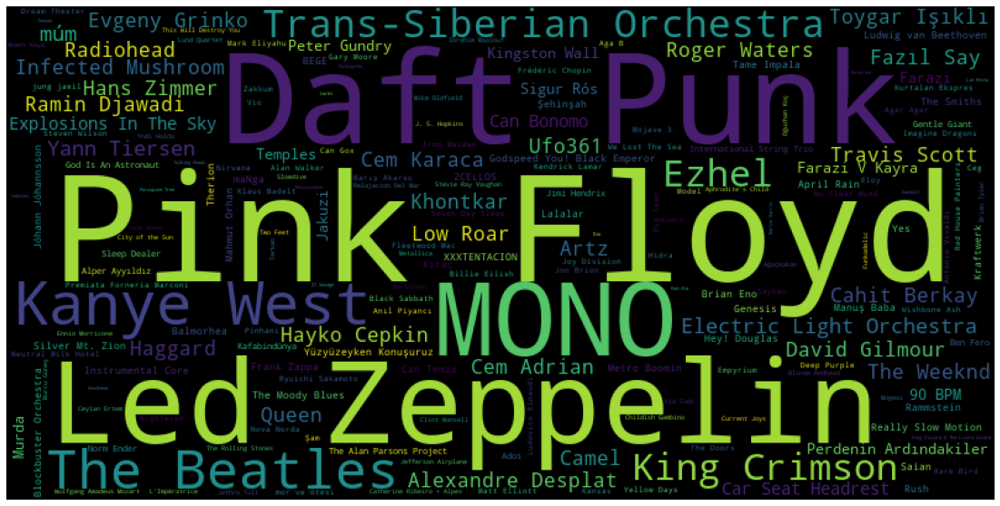

In [138]:
plt.figure( figsize=(20,10) )
plt.imshow(wordcloud)
plt.axis("off")
plt.show()

In [147]:
sp.currently_playing()

{'timestamp': 1653431636545,
 'context': {'external_urls': {'spotify': 'https://open.spotify.com/collection/tracks'},
  'href': 'https://api.spotify.com/v1/me/tracks',
  'type': 'collection',
  'uri': 'spotify:user:utkdgn-tr:collection'},
 'progress_ms': 99492,
 'item': {'album': {'album_type': 'album',
   'artists': [{'external_urls': {'spotify': 'https://open.spotify.com/artist/3Uz6jx81OY2J5K8Z4wmy2P'},
     'href': 'https://api.spotify.com/v1/artists/3Uz6jx81OY2J5K8Z4wmy2P',
     'id': '3Uz6jx81OY2J5K8Z4wmy2P',
     'name': 'Camel',
     'type': 'artist',
     'uri': 'spotify:artist:3Uz6jx81OY2J5K8Z4wmy2P'}],
   'available_markets': ['AD',
    'AE',
    'AR',
    'AT',
    'AU',
    'BA',
    'BD',
    'BE',
    'BG',
    'BH',
    'BO',
    'BR',
    'CA',
    'CH',
    'CI',
    'CL',
    'CM',
    'CO',
    'CR',
    'CW',
    'CY',
    'CZ',
    'DE',
    'DK',
    'DO',
    'EC',
    'EE',
    'EG',
    'ES',
    'FI',
    'FR',
    'GB',
    'GN',
    'GR',
    'GT',
    'HK',

# TOP STATS

In [146]:
sp.current_user_top_tracks(limit=20, offset=0, time_range='medium_term')

Enter the URL you were redirected to: https://www.google.com/?code=AQDpvk8UKms3n62bH2MzCFdY7Zd1DH_E0sLDiqTyXa_Kjpg6S2KtanKAclbOxHKm1Cxc-dT2LMpaC9n2kb-fAKl6Gybv78HDWkoXgGXUqKsZV_oJvz1Yq1pzL2yqYaL-TFu0clBauI4CTr4PlTent-TOkQBcmHzbpx_-uWltxX_XSGNOj0OVo82fwXGuo05SvE8nl-4Mg7AGVwcl2OsdzciQ1JcD8IE2p38aUbf2tXbdZb8Q8x7AwADp


{'items': [{'album': {'album_type': 'ALBUM',
    'artists': [{'external_urls': {'spotify': 'https://open.spotify.com/artist/0Y5tJX1MQlPlqiwlOH1tJY'},
      'href': 'https://api.spotify.com/v1/artists/0Y5tJX1MQlPlqiwlOH1tJY',
      'id': '0Y5tJX1MQlPlqiwlOH1tJY',
      'name': 'Travis Scott',
      'type': 'artist',
      'uri': 'spotify:artist:0Y5tJX1MQlPlqiwlOH1tJY'}],
    'available_markets': ['AD',
     'AE',
     'AR',
     'AT',
     'AU',
     'BE',
     'BG',
     'BH',
     'BO',
     'BR',
     'CA',
     'CH',
     'CL',
     'CO',
     'CR',
     'CY',
     'CZ',
     'DE',
     'DK',
     'DO',
     'DZ',
     'EC',
     'EE',
     'EG',
     'ES',
     'FI',
     'FR',
     'GB',
     'GR',
     'GT',
     'HK',
     'HN',
     'HU',
     'ID',
     'IE',
     'IL',
     'IN',
     'IS',
     'IT',
     'JO',
     'JP',
     'KW',
     'LB',
     'LI',
     'LT',
     'LU',
     'LV',
     'MA',
     'MC',
     'MT',
     'MX',
     'MY',
     'NI',
     'NL',
     'NO',
 